In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

In [4]:
from google.colab import files
uploaded = files.upload()
csv_path = "BPIC2011_filtered (1).csv"
df = pd.read_csv(csv_path)

Saving BPIC2011_filtered (1).csv to BPIC2011_filtered (1).csv


In [5]:
df.head()

,date,Count_C,Time_C_seconds,Count_HI,Time_HI_seconds,Count_HB,Time_HB_seconds,Count_I,Time_I_seconds,Resource_Involvement_Count,...,Recovery room / high care,Special lab Genetic Metabolic Diseases,Special lab Nuro sensory,Special lab radiology,"Subsection infectious deceases, tropical & AIDS",Subsection nephrology,Third party lab,subsection clinical immunology & rheumatology,surgery & urology clinic,TT
0,2005-01-03,31,0.0,10,345600.0,1,259200.0,2,3628800.0,88,...,0,0,0,0,0,0,0,0,0,604.416667
1,2005-01-05,1,0.0,4,2332800.0,0,0.0,0,0.0,10,...,0,0,0,0,0,0,0,0,0,0.000000
2,2005-01-06,49,0.0,17,518400.0,0,0.0,1,4147200.0,134,...,0,0,0,0,0,0,0,0,0,654.000000
3,2005-01-07,2,0.0,3,259200.0,2,864000.0,0,0.0,14,...,0,0,0,0,0,0,0,0,0,1133.000000
4,2005-01-08,0,0.0,0,0.0,0,0.0,1,432000.0,2,...,0,0,0,0,0,0,0,0,0,100.041667


In [6]:
df.tail()

,date,Count_C,Time_C_seconds,Count_HI,Time_HI_seconds,Count_HB,Time_HB_seconds,Count_I,Time_I_seconds,Resource_Involvement_Count,...,Recovery room / high care,Special lab Genetic Metabolic Diseases,Special lab Nuro sensory,Special lab radiology,"Subsection infectious deceases, tropical & AIDS",Subsection nephrology,Third party lab,subsection clinical immunology & rheumatology,surgery & urology clinic,TT
1166,2008-03-16,29,259200.0,2,0.0,0,0.0,0,0.0,62,...,0,0,0,0,0,0,0,0,0,0.0
1167,2008-03-17,131,86400.0,18,172800.0,0,0.0,1,259200.0,300,...,0,0,0,0,0,0,0,0,0,0.0
1168,2008-03-18,112,86400.0,8,0.0,0,0.0,0,0.0,240,...,0,0,0,0,0,0,0,0,0,0.0
1169,2008-03-19,19,86400.0,0,0.0,0,0.0,0,0.0,38,...,0,0,0,0,0,0,0,0,0,0.0
1170,2008-03-20,55,0.0,0,0.0,0,0.0,0,0.0,110,...,0,0,0,0,0,0,0,0,0,0.0


In [ ]:
# Step 1: Convert 'date' column to datetime
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# Step 2: Drop rows where date conversion failed (if any)
df = df.dropna(subset=['date'])

# Step 3: Reset index (optional)
df = df.reset_index(drop=True)



# ✅ Convert TT from hours to days
df['TT'] = df['TT'] / 24

# Save the filtered DataFrame
df.to_csv("BPIC2011_filtered.csv", index=False)

# Download the file (if you're in Colab)
from google.colab import files
files.download("BPIC2011_filtered.csv")





<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [7]:
df = pd.read_csv("BPIC2011_filtered (1).csv")

# Sort by time if not already sorted
df = df.sort_index()

# 🧪 Hold out the last 20% as final test set
n_test = int(len(df) * 0.20)
df_test_final = df.tail(n_test).copy()
df_train_full = df.drop(df_test_final.index).copy()

df_test_final

,date,Count_C,Time_C_seconds,Count_HI,Time_HI_seconds,Count_HB,Time_HB_seconds,Count_I,Time_I_seconds,Resource_Involvement_Count,...,Recovery room / high care,Special lab Genetic Metabolic Diseases,Special lab Nuro sensory,Special lab radiology,"Subsection infectious deceases, tropical & AIDS",Subsection nephrology,Third party lab,subsection clinical immunology & rheumatology,surgery & urology clinic,TT
937,2007-07-31,190,604800.0,43,777600.0,3,8035200.0,0,0.0,472,...,0,0,0,0,0,0,0,0,0,0.000000
938,2007-08-01,69,604800.0,23,864000.0,5,3888000.0,2,1296000.0,198,...,0,0,0,0,0,0,0,0,0,138.958333
939,2007-08-02,121,1296000.0,37,1123200.0,6,12873600.0,3,31960800.0,334,...,0,0,0,0,0,0,0,0,0,86.979167
940,2007-08-03,74,691200.0,25,518400.0,8,9849600.0,1,345600.0,216,...,0,0,0,0,0,0,0,0,0,0.000000
941,2007-08-04,117,691200.0,13,0.0,0,0.0,0,0.0,260,...,0,0,0,0,0,0,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1166,2008-03-16,29,259200.0,2,0.0,0,0.0,0,0.0,62,...,0,0,0,0,0,0,0,0,0,0.000000
1167,2008-03-17,131,86400.0,18,172800.0,0,0.0,1,259200.0,300,...,0,0,0,0,0,0,0,0,0,0.000000
1168,2008-03-18,112,86400.0,8,0.0,0,0.0,0,0.0,240,...,0,0,0,0,0,0,0,0,0,0.000000
1169,2008-03-19,19,86400.0,0,0.0,0,0.0,0,0.0,38,...,0,0,0,0,0,0,0,0,0,0.000000


In [8]:
df_train_full

,date,Count_C,Time_C_seconds,Count_HI,Time_HI_seconds,Count_HB,Time_HB_seconds,Count_I,Time_I_seconds,Resource_Involvement_Count,...,Recovery room / high care,Special lab Genetic Metabolic Diseases,Special lab Nuro sensory,Special lab radiology,"Subsection infectious deceases, tropical & AIDS",Subsection nephrology,Third party lab,subsection clinical immunology & rheumatology,surgery & urology clinic,TT
0,2005-01-03,31,0.0,10,345600.0,1,259200.0,2,3628800.0,88,...,0,0,0,0,0,0,0,0,0,604.416667
1,2005-01-05,1,0.0,4,2332800.0,0,0.0,0,0.0,10,...,0,0,0,0,0,0,0,0,0,0.000000
2,2005-01-06,49,0.0,17,518400.0,0,0.0,1,4147200.0,134,...,0,0,0,0,0,0,0,0,0,654.000000
3,2005-01-07,2,0.0,3,259200.0,2,864000.0,0,0.0,14,...,0,0,0,0,0,0,0,0,0,1133.000000
4,2005-01-08,0,0.0,0,0.0,0,0.0,1,432000.0,2,...,0,0,0,0,0,0,0,0,0,100.041667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932,2007-07-26,67,518400.0,27,950400.0,8,7344000.0,2,13215600.0,208,...,1,0,0,0,0,0,0,0,0,126.958333
933,2007-07-27,106,604800.0,34,3628800.0,6,14252400.0,3,4060800.0,298,...,1,0,0,1,0,0,0,0,0,14.000000
934,2007-07-28,72,604800.0,10,0.0,0,0.0,0,0.0,164,...,0,0,0,0,0,0,0,0,0,0.000000
935,2007-07-29,32,259200.0,14,345600.0,0,0.0,0,0.0,92,...,1,0,0,0,0,0,0,0,0,0.000000


In [9]:
#feature_engineering.py
import pandas as pd
import numpy as np
from scipy.signal import find_peaks

def feature_engineering(df, tt_lags=range(1, 4), actor_lags=range(1, 21), rolling_windows=[3, 7, 14], residual_target=True):
    df_model = df.copy()

    while df_model['TT'].iloc[-1] == 0:
        df_model = df_model.iloc[:-1]

    if residual_target:
        df_model['target'] = df_model['TT'].diff().rolling(window=3).mean().shift(1)
    else:
        df_model['target'] =df_model['TT'].shift(-1)

    # TT lags
    for lag in tt_lags:
        df_model[f'TT_lag{lag}'] = df_model['TT'].shift(lag)

    # TT rolling stats
    for window in rolling_windows:
        df_model[f'TT_rolling_mean{window}'] = df_model['TT'].rolling(window).mean().shift(1)
        df_model[f'TT_rolling_std{window}'] = df_model['TT'].rolling(window).std().shift(1)
        df_model[f'TT_rolling_max{window}'] = df_model['TT'].rolling(window).max().shift(1)

    df_model['TT_zscore7'] = (
        (df_model['TT'].shift(1) - df_model['TT_rolling_mean7']) /
        df_model['TT_rolling_std7']
    )

    actor_vars = ['Count_C', 'Count_HB', 'Count_I', 'Count_HI',
                  'Time_C_seconds', 'Time_I_seconds', 'Time_HI_seconds',
                  'Time_HB_seconds']

    for var in actor_vars:
        if var in df_model.columns:
            # Actor lags
            for lag in actor_lags:
                df_model[f'{var}_lag{lag}'] = df_model[var].shift(lag)

            # Rolling stats
            for window in rolling_windows:
                df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
                df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
                df_model[f'{var}_rolling_max{window}'] = df_model[var].rolling(window).max().shift(1)

            # Z-score
            df_model[f'{var}_zscore7'] = (
                (df_model[var].shift(1) - df_model[f'{var}_rolling_mean7']) /
                df_model[f'{var}_rolling_std7']
            )

    # Peak indicator
    peaks, _ = find_peaks(df_model['TT'], distance=7)
    df_model['peak_flag'] = 0
    df_model.iloc[peaks, df_model.columns.get_loc('peak_flag')] = 1

    df_model.dropna(inplace=True)

    # Feature lists
    baseline_features = [f'TT_lag{lag}' for lag in tt_lags]
    for w in rolling_windows:
        baseline_features += [f'TT_rolling_mean{w}', f'TT_rolling_std{w}', f'TT_rolling_max{w}']
    baseline_features += ['TT_zscore7', 'peak_flag']

    actor_features = []
    for var in actor_vars:
        if var in df_model.columns:
            actor_features.append(var)
            actor_features += [f'{var}_lag{lag}' for lag in actor_lags]

            for window in rolling_windows:
                for stat in ['rolling_mean', 'rolling_std', 'rolling_max']:
                    actor_features.append(f'{var}_{stat}{window}')

            actor_features.append(f'{var}_zscore7')

    actor_features = [f for f in actor_features if f not in baseline_features]

    return df_model.copy(), baseline_features, actor_features



/tmp/ipython-input-8-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-8-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-8-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

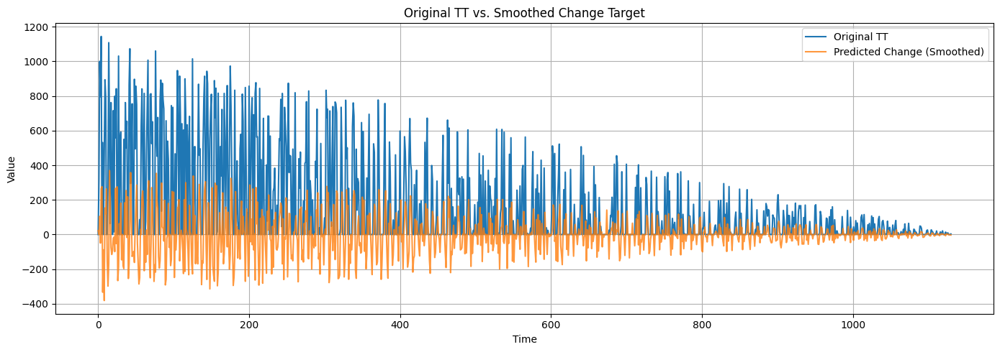

In [ ]:
import matplotlib.pyplot as plt

# Run feature engineering with change as the target
df_model_change, _, _ = feature_engineering(df, residual_target=True)

# Plot: Original TT vs. Smoothed Change
plt.figure(figsize=(14, 5))
plt.plot(df_model_change['TT'].values, label='Original TT')
plt.plot(df_model_change['target'].values, label='Predicted Change (Smoothed)', alpha=0.8)
plt.title("Original TT vs. Smoothed Change Target")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# XGBoost

In [ ]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel, sem, t, wilcoxon

In [ ]:
# Use best config from sweep
best_xgb_params = {
    'n_estimators': 3000,
    'learning_rate': 0.1,
    'max_depth': 6,
    'subsample': 0.9,
    'colsample_bytree': 0.9,
    'gamma': 0,
    'min_child_weight': 1,
    'random_state': 42
}

In [ ]:
#train_xgboost.py and train_lightgbm.py (shared structure)


# Load original data
df = df_train_full.copy()
tscv = TimeSeriesSplit(n_splits=5)

rmse_b, mae_b = [], []
rmse_a, mae_a = [], []
all_true, all_pred_b, all_pred_a = [], [], []
all_err_b, all_err_a = [], []
imp_b, imp_a = [], []

for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
    print(f"🔁 Fold {fold + 1}")

    df_train_raw = df.iloc[:test_idx[0]].copy()
    df_test_raw = df.iloc[test_idx].copy()

    df_train_fe, baseline_features, actor_features = feature_engineering(df_train_raw, residual_target=True)
    df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
    df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
    df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

    df_train_fe.dropna(inplace=True)
    df_test_fe.dropna(inplace=True)

    X_train_b = df_train_fe[baseline_features]
    X_test_b = df_test_fe[baseline_features]
    X_train_a = df_train_fe[baseline_features + actor_features]
    X_test_a = df_test_fe[baseline_features + actor_features]
    y_train = df_train_fe['target']
    y_test = df_test_fe['target']

    base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
    y_test = y_test.iloc[1:].reset_index(drop=True)
    X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
    X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

    # Baseline model
    model_b = XGBRegressor(**best_xgb_params)
    model_b.fit(X_train_b, y_train)
    pred_b = model_b.predict(X_test_b) + base_values

    # Actor-Enriched model
    model_a = XGBRegressor(**best_xgb_params)
    model_a.fit(X_train_a, y_train)
    pred_a = model_a.predict(X_test_a) + base_values

    y_true = base_values + y_test

    rmse_b.append(np.sqrt(mean_squared_error(y_true, pred_b)))
    mae_b.append(mean_absolute_error(y_true, pred_b))
    rmse_a.append(np.sqrt(mean_squared_error(y_true, pred_a)))
    mae_a.append(mean_absolute_error(y_true, pred_a))

    all_true.extend(y_true)
    all_pred_b.extend(pred_b)
    all_pred_a.extend(pred_a)
    all_err_b.extend(y_true - pred_b)
    all_err_a.extend(y_true - pred_a)

    imp_b.append(dict(zip(X_train_b.columns, model_b.feature_importances_)))
    imp_a.append(dict(zip(X_train_a.columns, model_a.feature_importances_)))

    if fold == tscv.get_n_splits() - 1:
        xgb_preds = {
            'y_true': y_true,
            'y_pred_b': pred_b,
            'y_pred_a': pred_a,
            'index': df_test_fe.index[1:]
        }

# Summary
print("\n📉 RMSEs:", rmse_b)
print("\n📉 MAEs:", mae_b)
print(f"\n🔍 RMSE Avg - Baseline: {np.mean(rmse_b):.2f} | Actor: {np.mean(rmse_a):.2f}")
print(f"🔍 MAE  Avg - Baseline: {np.mean(mae_b):.2f} | Actor: {np.mean(mae_a):.2f}")

# T-test
if len(rmse_b) > 1:
    stat, p_rmse = ttest_rel(rmse_b, rmse_a)
    print(f"\n📊 Paired t-test (RMSE): p = {p_rmse:.4f}")

# Visuals
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
sns.histplot(all_err_b, kde=True, label='Baseline', color='green', stat='density', bins=30)
sns.histplot(all_err_a, kde=True, label='Actor', color='red', stat='density', bins=30)
plt.legend(); plt.title("Prediction Errors")

plt.subplot(1, 2, 2)
plt.scatter(all_true, all_pred_b, label='Baseline', alpha=0.5, color='green')
plt.scatter(all_true, all_pred_a, label='Actor', alpha=0.5, color='red')
plt.plot([min(all_true), max(all_true)], [min(all_true), max(all_true)], 'k--')
plt.title("Actual vs Predicted"); plt.legend()
plt.tight_layout(); plt.show()

# Feature Importance
plt.figure(figsize=(8, 5))
pd.DataFrame(imp_b).mean(axis=0).sort_values(ascending=False).head(10).plot(kind='barh', color='green')
plt.title("Top Baseline Features"); plt.gca().invert_yaxis(); plt.show()

plt.figure(figsize=(8, 5))
pd.DataFrame(imp_a).mean(axis=0).sort_values(ascending=False).head(10).plot(kind='barh', color='red')
plt.title("Top Actor-Enriched Features"); plt.gca().invert_yaxis(); plt.show()

from scipy.stats import ttest_rel, sem, t

def cohen_d(x, y):
    diff = np.array(x) - np.array(y)
    return diff.mean() / diff.std(ddof=1)

def confidence_interval(data, confidence=0.95):
    m = np.mean(data)
    se = sem(data)
    h = se * t.ppf((1 + confidence) / 2., len(data)-1)
    return f"{m:.3f} ± {h:.3f}"

def summarize_model_comparison(name, rmse_b, rmse_a, mae_b, mae_a):
    stat, p_rmse = ttest_rel(rmse_b, rmse_a)

    rmse_improvement = np.mean(rmse_b) - np.mean(rmse_a)
    mae_improvement = np.mean(mae_b) - np.mean(mae_a)

    return {
        'Model': name,
        'RMSE Baseline': confidence_interval(rmse_b),
        'RMSE Actor': confidence_interval(rmse_a),
        'RMSE Δ': f"{rmse_improvement:.3f}",  # ← RMSE improvement
        'MAE Baseline': confidence_interval(mae_b),
        'MAE Actor': confidence_interval(mae_a),
        'MAE Δ': f"{mae_improvement:.3f}",    # ← MAE improvement
        'p-value (RMSE)': f"{p_rmse:.4f}",
        'Cohen’s d': f"{cohen_d(rmse_b, rmse_a):.3f}"
    }

from scipy.stats import wilcoxon

stat_w, p_wilcoxon = wilcoxon(rmse_b, rmse_a)
print(f"📊 Wilcoxon signed-rank test (RMSE): p = {p_wilcoxon:.4f}")


results = []
results.append(summarize_model_comparison("XGBoost", rmse_b, rmse_a, mae_b, mae_a))
# Repeat for LightGBM, LSTM, GRU, etc.
results_df = pd.DataFrame(results)
print(" Final Model Comparison Table:")
print(results_df.to_markdown())

plt.figure(figsize=(14, 6))
plt.plot(xgb_preds['index'], xgb_preds['y_true'], label='Actual', color='black')
plt.plot(xgb_preds['index'], xgb_preds['y_pred_b'], '--', label='XGBoost Baseline', color='green')
plt.plot(xgb_preds['index'], xgb_preds['y_pred_a'], '--', label='XGBoost Actor-Enriched', color='red')
plt.title("📈 XGBoost: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


🎯 Testing on final unseen holdout set...


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

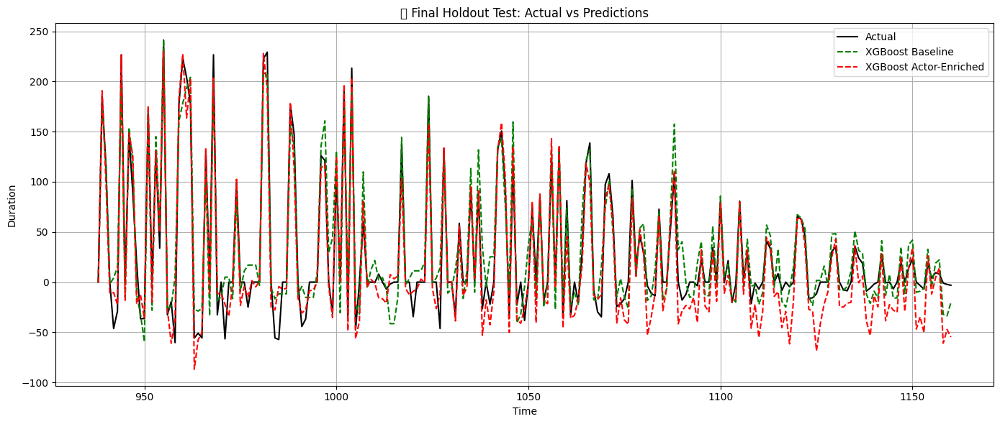


📊 Final Holdout Test Results Summary:
| Model   | RMSE Baseline   | RMSE Actor     |   RMSE Δ | MAE Baseline   | MAE Actor      |   MAE Δ | R² Baseline   | R² Actor      |   R² Δ |
|:--------|:----------------|:---------------|---------:|:---------------|:---------------|--------:|:--------------|:--------------|-------:|
| XGBoost | 22.457 ± 1.317  | 21.204 ± 1.048 |    1.253 | 17.275 ± 1.021 | 15.993 ± 0.922 |   1.283 | 0.882 ± 0.020 | 0.895 ± 0.017 |  0.013 |


 97%|=================== | 217/223 [00:24<00:00]       

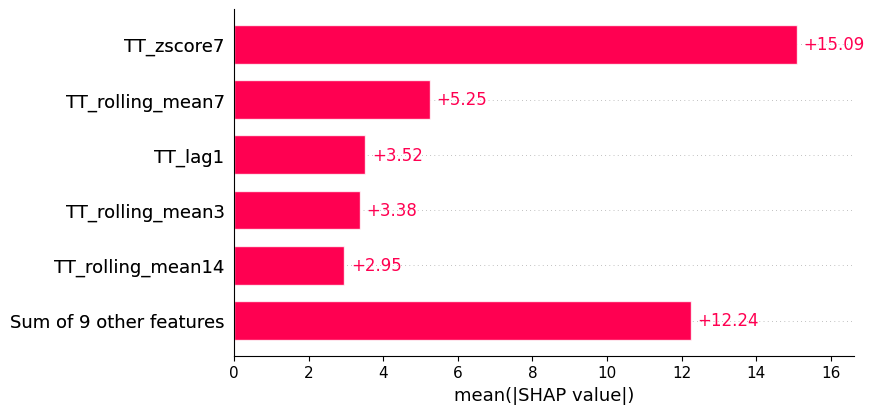

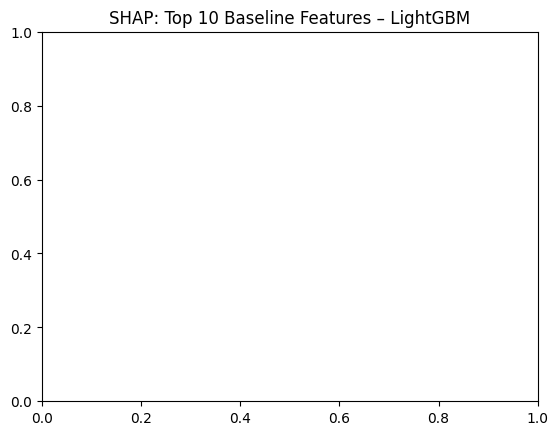

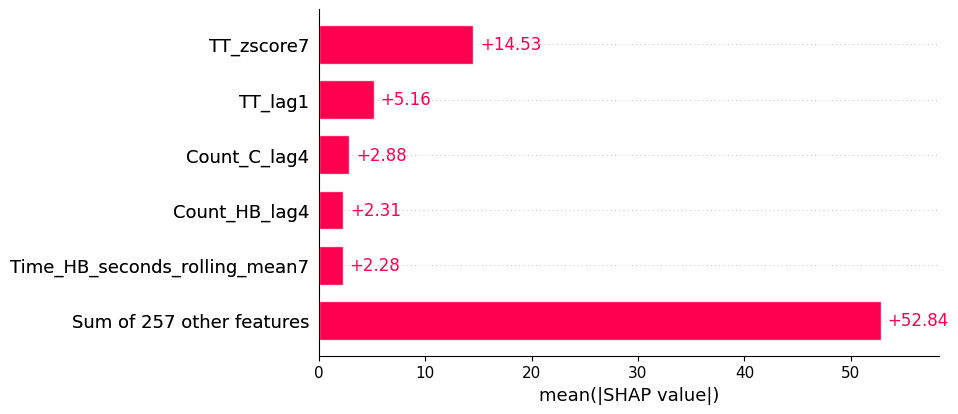

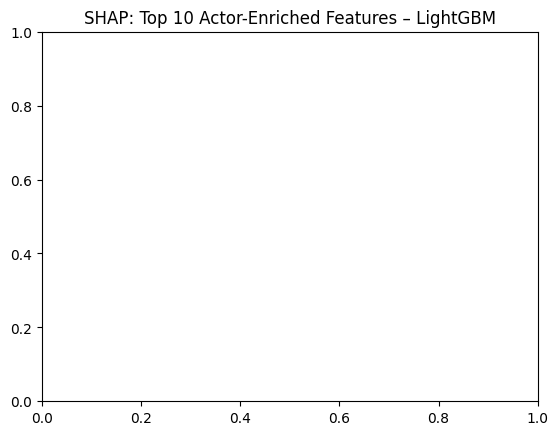

In [ ]:
# --- Final Holdout Evaluation ---
print("\n🎯 Testing on final unseen holdout set...")

# Feature engineering
df_train_fe, baseline_features, actor_features = feature_engineering(df_train_full, residual_target=True)
df_context = pd.concat([df_train_full.tail(40), df_test_final])
df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
df_test_fe = df_test_fe.loc[df_test_final.index.intersection(df_test_fe.index)]

df_train_fe.dropna(inplace=True)
df_test_fe.dropna(inplace=True)

# Split features + target
X_train_b = df_train_fe[baseline_features]
X_train_a = df_train_fe[baseline_features + actor_features]
y_train = df_train_fe['target']

X_test_b = df_test_fe[baseline_features]
X_test_a = df_test_fe[baseline_features + actor_features]
y_test = df_test_fe['target']

# Align target and features
base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
y_test = y_test.iloc[1:].reset_index(drop=True)
X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

# Train final models on full training data
final_model_b = XGBRegressor(**best_xgb_params)
final_model_b.fit(X_train_b, y_train)

final_model_a = XGBRegressor(**best_xgb_params)
final_model_a.fit(X_train_a, y_train)

# Predict
pred_b = final_model_b.predict(X_test_b) + base_values
pred_a = final_model_a.predict(X_test_a) + base_values
y_true = base_values + y_test

from sklearn.utils import resample

def bootstrap_summary(y_true, y_pred, n_bootstrap=1000, alpha=0.05, seed=42):
    rng = np.random.RandomState(seed)
    rmse_vals, mae_vals, r2_vals = [], [], []
    n = len(y_true)

    for _ in range(n_bootstrap):
        idx = rng.choice(n, n, replace=True)
        yt_bs = y_true[idx]
        yp_bs = y_pred[idx]
        rmse_vals.append(np.sqrt(mean_squared_error(yt_bs, yp_bs)))
        mae_vals.append(mean_absolute_error(yt_bs, yp_bs))
        r2_vals.append(r2_score(yt_bs, yp_bs))

    def summary(vals):
        return np.mean(vals), np.std(vals)

    return {
        'rmse': summary(rmse_vals),
        'mae': summary(mae_vals),
        'r2': summary(r2_vals)
    }

metrics_b = bootstrap_summary(y_true.values, pred_b, seed=42)
metrics_a = bootstrap_summary(y_true.values, pred_a, seed=42)

# Point estimates and standard deviations
mean_rmse_b, std_rmse_b = metrics_b['rmse']
mean_rmse_a, std_rmse_a = metrics_a['rmse']
mean_mae_b, std_mae_b = metrics_b['mae']
mean_mae_a, std_mae_a = metrics_a['mae']
mean_r2_b, std_r2_b = metrics_b['r2']
mean_r2_a, std_r2_a = metrics_a['r2']

def fmt(mean, std):
    return f"{mean:.3f} ± {std:.3f}"

# Optional: plot
plt.figure(figsize=(14, 6))
plt.plot(df_test_fe.index[1:], y_true, label='Actual', color='black')
plt.plot(df_test_fe.index[1:], pred_b, '--', label='XGBoost Baseline', color='green')
plt.plot(df_test_fe.index[1:], pred_a, '--', label='XGBoost Actor-Enriched', color='red')
plt.title("📈 Final Holdout Test: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

summary_test = pd.DataFrame([{
    'Model': 'XGBoost',
    'RMSE Baseline': fmt(mean_rmse_b, std_rmse_b),
    'RMSE Actor': fmt(mean_rmse_a, std_rmse_a),
    'RMSE Δ': f"{mean_rmse_b - mean_rmse_a:.3f}",
    'MAE Baseline': fmt(mean_mae_b, std_mae_b),
    'MAE Actor': fmt(mean_mae_a, std_mae_a),
    'MAE Δ': f"{mean_mae_b - mean_mae_a:.3f}",
    'R² Baseline': fmt(mean_r2_b, std_r2_b),
    'R² Actor': fmt(mean_r2_a, std_r2_a),
    'R² Δ': f"{mean_r2_a - mean_r2_b:.3f}",
}])

print("\n📊 Final Holdout Test Results Summary:")
print(summary_test.to_markdown(index=False))

# -------------------------------------
# 🔍 Feature Importance for Baseline and Actor-Enriched Models
# -------------------------------------

import shap

explainer_b = shap.Explainer(final_model_b, X_test_b)
shap_values_b = explainer_b(X_test_b)

explainer_a = shap.Explainer(final_model_a, X_test_a)
shap_values_a = explainer_a(X_test_a)

# Plot baseline
shap.plots.bar(shap_values_b, max_display=6, show=True)
plt.title("SHAP: Top 10 Baseline Features – LightGBM")
plt.show()

# Plot actor-enriched
shap.plots.bar(shap_values_a, max_display=6, show=True)
plt.title("SHAP: Top 10 Actor-Enriched Features – LightGBM")
plt.show()


tuning

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import pandas as pd
import numpy as np
from itertools import product

# --- Define fixed hyperparameter sets to test ---
param_grid = {
    'n_estimators': [1000, 1500, 3000],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [5, 6, 7],
    'subsample': [0.6, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.8, 0.9],
    'gamma': [0],
    'min_child_weight': [1]
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

# --- Load data ---
df = df_train_full.copy()
tscv = TimeSeriesSplit(n_splits=5)

results_summary = []

# --- Loop through hyperparameter combinations ---
for i, param_values in enumerate(param_combos):
    params = dict(zip(param_names, param_values))
    print("\n" + "="*60)
    print(f"🔧 [{i+1}/{len(param_combos)}] Testing configuration:")
    for k, v in params.items():
        print(f"   {k}: {v}")
    print("="*60)

    rmse_b, rmse_a = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, baseline_features, actor_features = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        X_train_b = df_train_fe[baseline_features]
        X_test_b = df_test_fe[baseline_features]
        X_train_a = df_train_fe[baseline_features + actor_features]
        X_test_a = df_test_fe[baseline_features + actor_features]
        y_train = df_train_fe['target']
        y_test = df_test_fe['target']

        base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
        y_test = y_test.iloc[1:].reset_index(drop=True)
        X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
        X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

        model_b = XGBRegressor(**params, random_state=42)
        model_b.fit(X_train_b, y_train)
        pred_b = model_b.predict(X_test_b) + base_values

        model_a = XGBRegressor(**params, random_state=42)
        model_a.fit(X_train_a, y_train)
        pred_a = model_a.predict(X_test_a) + base_values

        y_true = base_values + y_test

        rmse_fold_b = np.sqrt(mean_squared_error(y_true, pred_b))
        rmse_fold_a = np.sqrt(mean_squared_error(y_true, pred_a))
        rmse_b.append(rmse_fold_b)
        rmse_a.append(rmse_fold_a)

        print(f"   📉 Fold {fold+1} RMSE - Baseline: {rmse_fold_b:.4f} | Actor: {rmse_fold_a:.4f}")

    avg_rmse_b = np.mean(rmse_b)
    avg_rmse_a = np.mean(rmse_a)
    delta = avg_rmse_b - avg_rmse_a
    outperforms = delta > 0

    print(f"✅ Avg RMSE - Baseline: {avg_rmse_b:.4f} | Actor: {avg_rmse_a:.4f} | Δ = {delta:.4f} | {'Actor Wins ✅' if outperforms else 'Baseline Wins ❌'}")

    results_summary.append({
        'params': params,
        'rmse_baseline': avg_rmse_b,
        'rmse_actor': avg_rmse_a,
        'delta': delta,
        'outperforms': outperforms
    })

# --- Final Summary ---
summary_df = pd.DataFrame(results_summary)
summary_df = summary_df.sort_values(by='delta', ascending=False)

print("\n\n📋 Final Results Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))




Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


# LightGBM

In [ ]:
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel, sem, t, wilcoxon

In [ ]:
best_lgbm_params = {
    'n_estimators': 1500,
    'learning_rate': 0.2,
    'max_depth': 7,
    'bagging_fraction': 0.6,
    'feature_fraction': 0.8,
    'reg_alpha': 0,
    'reg_lambda': 0,
    'min_child_samples': 1,
    'random_state': 42
}

🔁 Fold 1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 94
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 14
[LightGBM] [Info] Start training from score -9.294907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 214, number of used features: 14
[LightGBM] [Info] Start training from score -0.597060
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

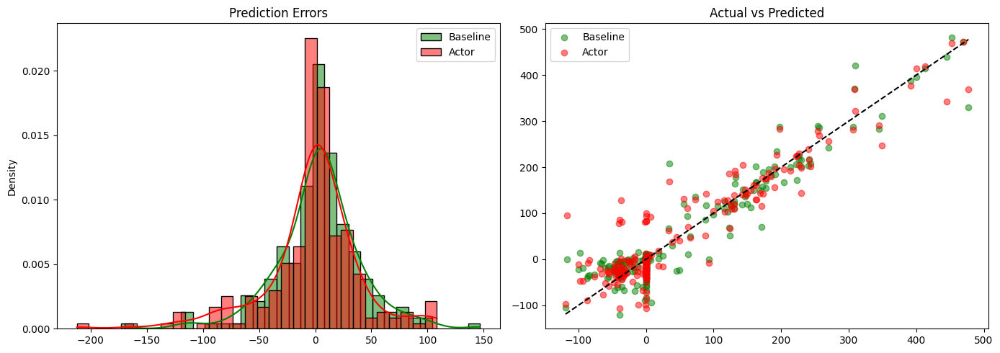

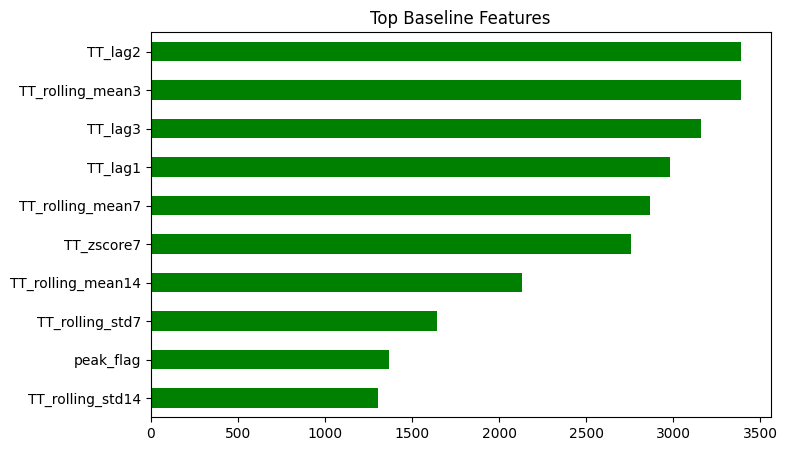

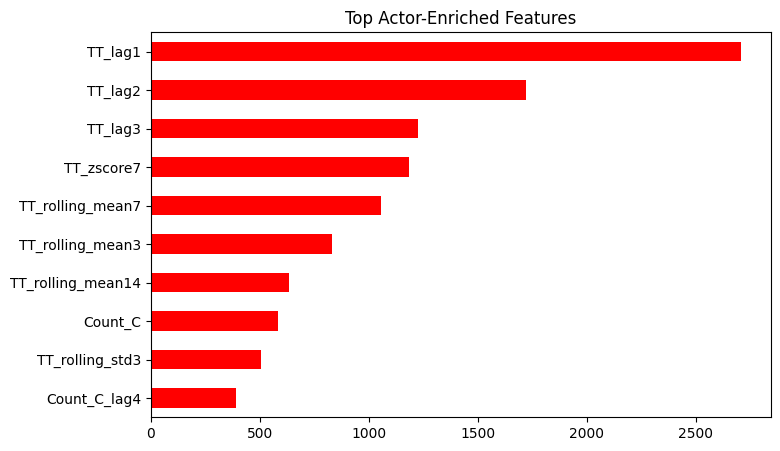

/tmp/ipython-input-14-2035663764.py:175: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


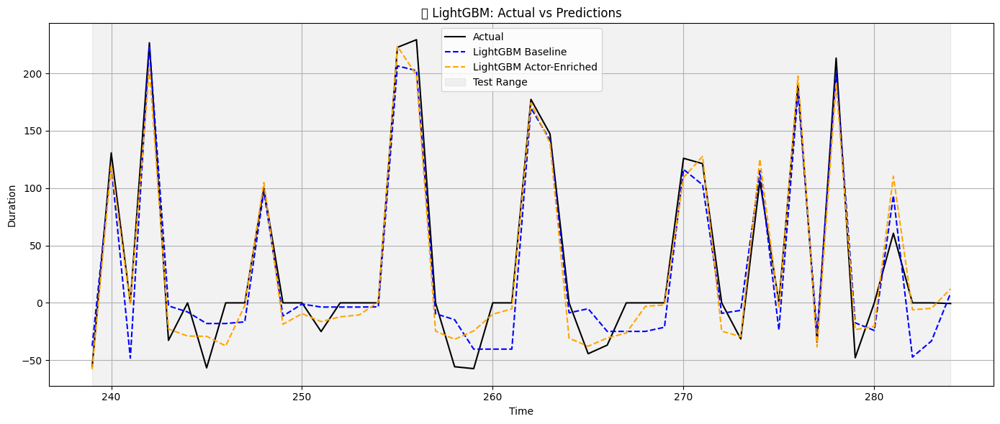

In [ ]:
# LightGBM.py
# Load original data
df = df_train_full.copy()
tscv = TimeSeriesSplit(n_splits=5)

rmse_b, mae_b = [], []
rmse_a, mae_a = [], []
all_true, all_pred_b, all_pred_a = [], [], []
all_err_b, all_err_a = [], []
imp_b, imp_a = [], []

for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
    print(f"🔁 Fold {fold + 1}")

    df_train_raw = df.iloc[:test_idx[0]].copy()
    df_test_raw = df.iloc[test_idx].copy()

    df_train_fe, baseline_features, actor_features = feature_engineering(df_train_raw, residual_target=True)
    df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
    df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
    df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

    df_train_fe.dropna(inplace=True)
    df_test_fe.dropna(inplace=True)

    X_train_b = df_train_fe[baseline_features]
    X_test_b = df_test_fe[baseline_features]
    X_train_a = df_train_fe[baseline_features + actor_features]
    X_test_a = df_test_fe[baseline_features + actor_features]
    y_train = df_train_fe['target']
    y_test = df_test_fe['target']

    base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
    y_test = y_test.iloc[1:].reset_index(drop=True)
    X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
    X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

    # Baseline model
    model_b = LGBMRegressor(**best_lgbm_params)
    model_b.fit(X_train_b, y_train)
    pred_b = model_b.predict(X_test_b) + base_values

    # Actor-Enriched model
    model_a = LGBMRegressor(**best_lgbm_params)
    model_a.fit(X_train_a, y_train)
    pred_a = model_a.predict(X_test_a) + base_values

    y_true = base_values + y_test

    rmse_b.append(np.sqrt(mean_squared_error(y_true, pred_b)))
    mae_b.append(mean_absolute_error(y_true, pred_b))
    rmse_a.append(np.sqrt(mean_squared_error(y_true, pred_a)))
    mae_a.append(mean_absolute_error(y_true, pred_a))

    all_true.extend(y_true)
    all_pred_b.extend(pred_b)
    all_pred_a.extend(pred_a)
    all_err_b.extend(y_true - pred_b)
    all_err_a.extend(y_true - pred_a)

    imp_b.append(dict(zip(X_train_b.columns, model_b.feature_importances_)))
    imp_a.append(dict(zip(X_train_a.columns, model_a.feature_importances_)))

    if fold == tscv.get_n_splits() - 1:
        lgb_preds = {
            'y_true': y_true,
            'y_pred_b': pred_b,
            'y_pred_a': pred_a,
            'index': df_test_fe.index[1:]
        }


# ==============================
# 📊 Statistical Summary
# ==============================
def cohen_d(x, y):
    diff = np.array(x) - np.array(y)
    return diff.mean() / diff.std(ddof=1)

def confidence_interval(data, confidence=0.95):
    m = np.mean(data)
    se = sem(data)
    h = se * t.ppf((1 + confidence) / 2., len(data)-1)
    return f"{m:.3f} ± {h:.3f}"

def summarize_model_comparison(name, rmse_b, rmse_a, mae_b, mae_a):
    stat, p_rmse = ttest_rel(rmse_b, rmse_a)

    rmse_improvement = np.mean(rmse_b) - np.mean(rmse_a)
    mae_improvement = np.mean(mae_b) - np.mean(mae_a)

    return {
        'Model': name,
        'RMSE Baseline': confidence_interval(rmse_b),
        'RMSE Actor': confidence_interval(rmse_a),
        'RMSE Δ': f"{rmse_improvement:.3f}",  # ← RMSE improvement
        'MAE Baseline': confidence_interval(mae_b),
        'MAE Actor': confidence_interval(mae_a),
        'MAE Δ': f"{mae_improvement:.3f}",    # ← MAE improvement
        'p-value (RMSE)': f"{p_rmse:.4f}",
        'Cohen’s d': f"{cohen_d(rmse_b, rmse_a):.3f}"
    }


# Store results in global list
results = [] if 'results' not in globals() else results
results.append(summarize_model_comparison("LightGBM", rmse_b, rmse_a, mae_b, mae_a))

# ==============================
# 📈 Visualizations
# ==============================
print(f"\n🔍 RMSE Avg - Baseline: {np.mean(rmse_b):.2f} | Actor: {np.mean(rmse_a):.2f}")
print(f"🔍 MAE  Avg - Baseline: {np.mean(mae_b):.2f} | Actor: {np.mean(mae_a):.2f}")
print(f"📊 Final Comparison Row: {results[-1]}")

plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
sns.histplot(all_err_b, kde=True, label='Baseline', color='green', stat='density', bins=30)
sns.histplot(all_err_a, kde=True, label='Actor', color='red', stat='density', bins=30)
plt.legend(); plt.title("Prediction Errors")

plt.subplot(1, 2, 2)
plt.scatter(all_true, all_pred_b, label='Baseline', alpha=0.5, color='green')
plt.scatter(all_true, all_pred_a, label='Actor', alpha=0.5, color='red')
plt.plot([min(all_true), max(all_true)], [min(all_true), max(all_true)], 'k--')
plt.title("Actual vs Predicted"); plt.legend()
plt.tight_layout(); plt.show()

plt.figure(figsize=(8, 5))
pd.DataFrame(imp_b).mean(axis=0).sort_values(ascending=False).head(10).plot(kind='barh', color='green')
plt.title("Top Baseline Features"); plt.gca().invert_yaxis(); plt.show()

plt.figure(figsize=(8, 5))
pd.DataFrame(imp_a).mean(axis=0).sort_values(ascending=False).head(10).plot(kind='barh', color='red')
plt.title("Top Actor-Enriched Features"); plt.gca().invert_yaxis(); plt.show()

# Optional: view full comparison table if other models ran before
if len(results) > 1:
    results_df = pd.DataFrame(results)
    print("\n📊 Final Model Comparison Table:")
    print(results_df.to_markdown())

plt.figure(figsize=(14, 6))
plt.plot(lgb_preds['index'], lgb_preds['y_true'], label='Actual', color='black')
plt.plot(lgb_preds['index'], lgb_preds['y_pred_b'], '--', label='LightGBM Baseline', color='blue')
plt.plot(lgb_preds['index'], lgb_preds['y_pred_a'], '--', label='LightGBM Actor-Enriched', color='orange')
plt.axvspan(lgb_preds['index'][0], lgb_preds['index'][-1], color='gray', alpha=0.1, label='Test Range')
plt.title("📈 LightGBM: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



🎯 Testing on final unseen holdout set...


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2681
[LightGBM] [Info] Number of data points in the train set: 904, number of used features: 14
[LightGBM] [Info] Start training from score -0.201189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

/tmp/ipython-input-18-2642334642.py:89: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


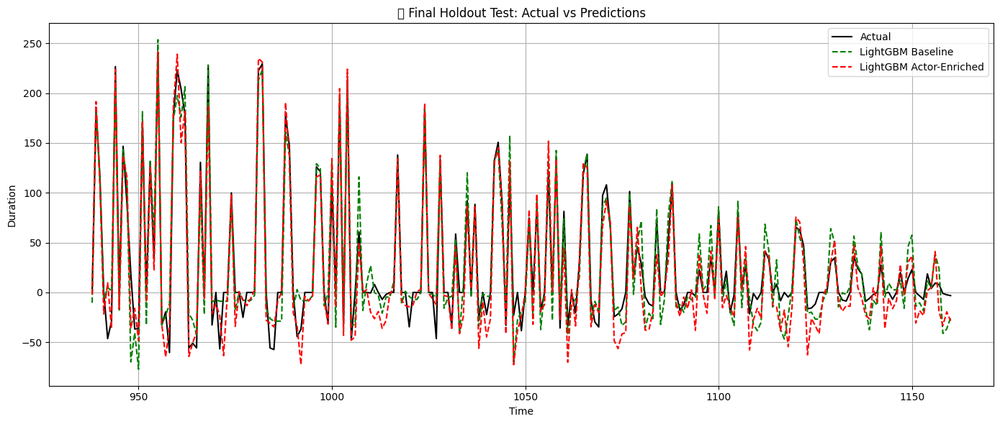


📊 Final Holdout Test Results Summary:
| Model    | RMSE Baseline   | RMSE Actor     |   RMSE Δ | MAE Baseline   | MAE Actor      |   MAE Δ | R² Baseline   | R² Actor      |   R² Δ |
|:---------|:----------------|:---------------|---------:|:---------------|:---------------|--------:|:--------------|:--------------|-------:|
| LightGBM | 20.562 ± 1.233  | 20.017 ± 1.059 |    0.545 | 15.676 ± 0.908 | 15.253 ± 0.891 |   0.423 | 0.901 ± 0.018 | 0.907 ± 0.016 |  0.005 |


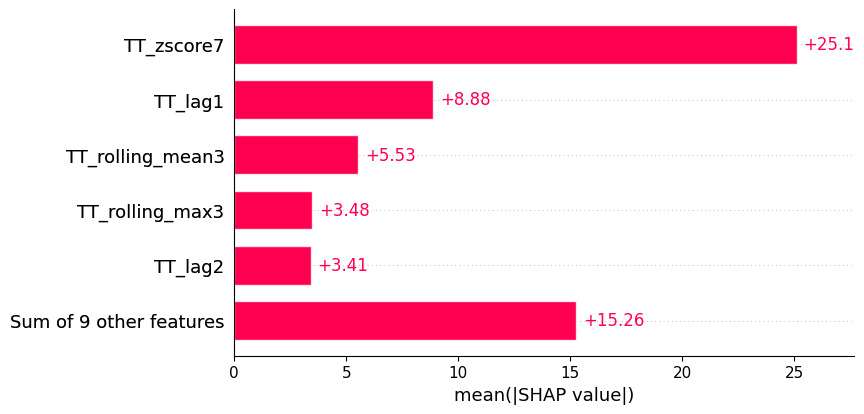

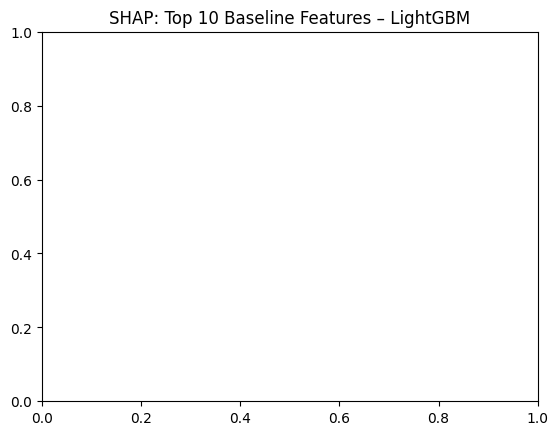

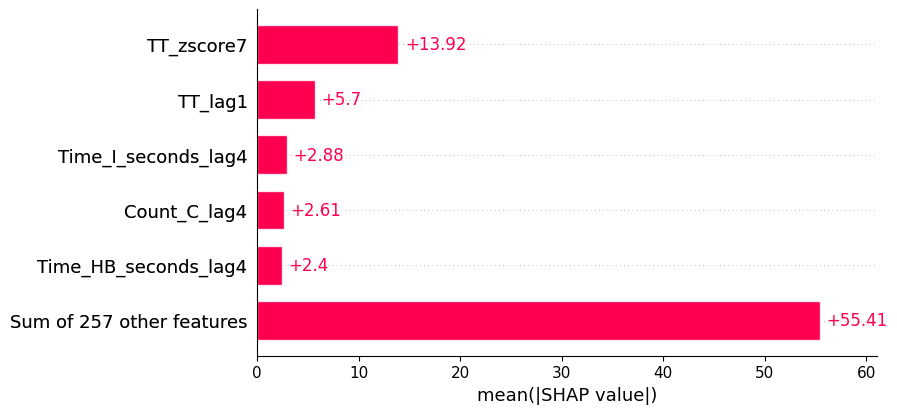

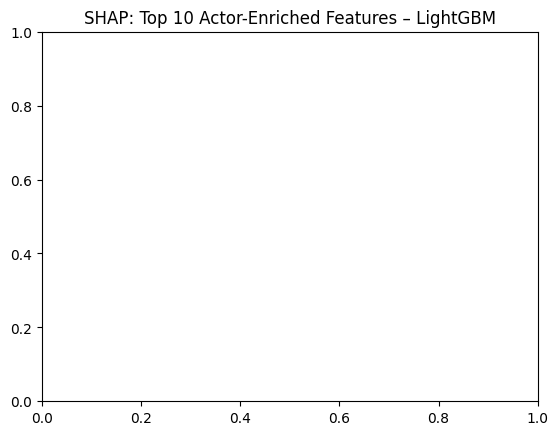

In [ ]:
# --- Final Holdout Evaluation ---
print("\n🎯 Testing on final unseen holdout set...")

# Feature engineering
df_train_fe, baseline_features, actor_features = feature_engineering(df_train_full, residual_target=True)
df_context = pd.concat([df_train_full.tail(40), df_test_final])
df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
df_test_fe = df_test_fe.loc[df_test_final.index.intersection(df_test_fe.index)]

df_train_fe.dropna(inplace=True)
df_test_fe.dropna(inplace=True)

# Split features + target
X_train_b = df_train_fe[baseline_features]
X_train_a = df_train_fe[baseline_features + actor_features]
y_train = df_train_fe['target']

X_test_b = df_test_fe[baseline_features]
X_test_a = df_test_fe[baseline_features + actor_features]
y_test = df_test_fe['target']

# Align target and features
base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
y_test = y_test.iloc[1:].reset_index(drop=True)
X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

# Train final models on full training data
final_model_b = LGBMRegressor(**best_lgbm_params)
final_model_b.fit(X_train_b, y_train)

final_model_a = LGBMRegressor(**best_lgbm_params)
final_model_a.fit(X_train_a, y_train)

# Predict
pred_b = final_model_b.predict(X_test_b) + base_values
pred_a = final_model_a.predict(X_test_a) + base_values
y_true = base_values + y_test

from sklearn.utils import resample

def bootstrap_summary(y_true, y_pred, n_bootstrap=1000, alpha=0.05, seed=42):
    rng = np.random.RandomState(seed)
    rmse_vals, mae_vals, r2_vals = [], [], []
    n = len(y_true)

    for _ in range(n_bootstrap):
        idx = rng.choice(n, n, replace=True)
        yt_bs = y_true[idx]
        yp_bs = y_pred[idx]
        rmse_vals.append(np.sqrt(mean_squared_error(yt_bs, yp_bs)))
        mae_vals.append(mean_absolute_error(yt_bs, yp_bs))
        r2_vals.append(r2_score(yt_bs, yp_bs))

    def summary(vals):
        return np.mean(vals), np.std(vals)

    return {
        'rmse': summary(rmse_vals),
        'mae': summary(mae_vals),
        'r2': summary(r2_vals)
    }

metrics_b = bootstrap_summary(y_true.values, pred_b, seed=42)
metrics_a = bootstrap_summary(y_true.values, pred_a, seed=42)


# Point estimates and standard deviations
mean_rmse_b, std_rmse_b = metrics_b['rmse']
mean_rmse_a, std_rmse_a = metrics_a['rmse']
mean_mae_b, std_mae_b = metrics_b['mae']
mean_mae_a, std_mae_a = metrics_a['mae']
mean_r2_b, std_r2_b = metrics_b['r2']
mean_r2_a, std_r2_a = metrics_a['r2']

def fmt(mean, std):
    return f"{mean:.3f} ± {std:.3f}"

# Optional: plot
plt.figure(figsize=(14, 6))
plt.plot(df_test_fe.index[1:], y_true, label='Actual', color='black')
plt.plot(df_test_fe.index[1:], pred_b, '--', label='LightGBM Baseline', color='green')
plt.plot(df_test_fe.index[1:], pred_a, '--', label='LightGBM Actor-Enriched', color='red')
plt.title("📈 Final Holdout Test: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

summary_test = pd.DataFrame([{
    'Model': 'LightGBM',
    'RMSE Baseline': fmt(mean_rmse_b, std_rmse_b),
    'RMSE Actor': fmt(mean_rmse_a, std_rmse_a),
    'RMSE Δ': f"{mean_rmse_b - mean_rmse_a:.3f}",
    'MAE Baseline': fmt(mean_mae_b, std_mae_b),
    'MAE Actor': fmt(mean_mae_a, std_mae_a),
    'MAE Δ': f"{mean_mae_b - mean_mae_a:.3f}",
    'R² Baseline': fmt(mean_r2_b, std_r2_b),
    'R² Actor': fmt(mean_r2_a, std_r2_a),
    'R² Δ': f"{mean_r2_a - mean_r2_b:.3f}",
}])

print("\n📊 Final Holdout Test Results Summary:")
print(summary_test.to_markdown(index=False))

# -------------------------------------
# 🔍 Feature Importance for Baseline and Actor-Enriched Models
# -------------------------------------
import shap

# Baseline model
explainer_b = shap.Explainer(final_model_b, X_test_b)
shap_values_b = explainer_b(X_test_b, check_additivity=False)

# Actor-enriched model
explainer_a = shap.Explainer(final_model_a, X_test_a)
shap_values_a = explainer_a(X_test_a, check_additivity=False)

# Plot SHAP feature importance
shap.plots.bar(shap_values_b, max_display=6, show=True)
plt.title("SHAP: Top 10 Baseline Features – LightGBM")
plt.show()

shap.plots.bar(shap_values_a, max_display=6, show=True)
plt.title("SHAP: Top 10 Actor-Enriched Features – LightGBM")
plt.show()


tuning

In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np
from itertools import product

# --- Define LightGBM hyperparameter sets to test ---
param_grid = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 6, 7],
    'bagging_fraction': [0.6, 0.8, 0.9],
    'feature_fraction': [0.6, 0.8, 0.9],
    'reg_alpha': [0.0],
    'reg_lambda': [0.0],
    'min_child_samples': [1],
    'n_estimators': [1000, 1500, 3000],
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

# --- Load data ---
df = df_train_full.copy()
tscv = TimeSeriesSplit(n_splits=5)

results_summary = []

# --- Loop through hyperparameter combinations ---
for i, param_values in enumerate(param_combos):
    params_raw = dict(zip(param_names, param_values))

    # Map params to LightGBM equivalents
    params = {
        'n_estimators': params_raw['n_estimators'],
        'learning_rate': params_raw['learning_rate'],
        'max_depth': params_raw['max_depth'],
        'bagging_fraction': params_raw['bagging_fraction'],
        'feature_fraction': params_raw['feature_fraction'],
        'reg_alpha': params_raw['reg_alpha'],
        'reg_lambda': params_raw['reg_lambda'],
        'min_child_samples': params_raw['min_child_samples'],
        'random_state': 42
    }

    print("\n" + "="*60)
    print(f"🔧 [{i+1}/{len(param_combos)}] Testing configuration:")
    for k, v in params.items():
        print(f"   {k}: {v}")
    print("="*60)

    rmse_b, rmse_a = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, baseline_features, actor_features = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        X_train_b = df_train_fe[baseline_features]
        X_test_b = df_test_fe[baseline_features]
        X_train_a = df_train_fe[baseline_features + actor_features]
        X_test_a = df_test_fe[baseline_features + actor_features]
        y_train = df_train_fe['target']
        y_test = df_test_fe['target']

        base_values = df_test_fe['TT'].shift(1).iloc[1:].reset_index(drop=True)
        y_test = y_test.iloc[1:].reset_index(drop=True)
        X_test_b = X_test_b.iloc[1:].reset_index(drop=True)
        X_test_a = X_test_a.iloc[1:].reset_index(drop=True)

        model_b = LGBMRegressor(**params)
        model_b.fit(X_train_b, y_train)
        pred_b = model_b.predict(X_test_b) + base_values

        model_a = LGBMRegressor(**params)
        model_a.fit(X_train_a, y_train)
        pred_a = model_a.predict(X_test_a) + base_values

        y_true = base_values + y_test

        rmse_fold_b = np.sqrt(mean_squared_error(y_true, pred_b))
        rmse_fold_a = np.sqrt(mean_squared_error(y_true, pred_a))
        rmse_b.append(rmse_fold_b)
        rmse_a.append(rmse_fold_a)

        print(f"   📉 Fold {fold+1} RMSE - Baseline: {rmse_fold_b:.4f} | Actor: {rmse_fold_a:.4f}")

    avg_rmse_b = np.mean(rmse_b)
    avg_rmse_a = np.mean(rmse_a)
    delta = avg_rmse_b - avg_rmse_a
    outperforms = delta > 0

    print(f"✅ Avg RMSE - Baseline: {avg_rmse_b:.4f} | Actor: {avg_rmse_a:.4f} | Δ = {delta:.4f} | {'Actor Wins ✅' if outperforms else 'Baseline Wins ❌'}")

    results_summary.append({
        'params': params,
        'rmse_baseline': avg_rmse_b,
        'rmse_actor': avg_rmse_a,
        'delta': delta,
        'outperforms': outperforms
    })

# --- Final Summary ---
summary_df = pd.DataFrame(results_summary)
summary_df = summary_df.sort_values(by='delta', ascending=False)

print("\n\n📋 Final Results Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


In [ ]:
print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))

# RNN

In [10]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import (
    LSTM, GRU, Dense, Dropout, Input, Bidirectional,
    Conv1D, MaxPooling1D, GlobalAveragePooling1D,
    LayerNormalization, MultiHeadAttention
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

import os
import random

In [ ]:
#RNN with attention.py
#from feature_engineering import feature_engineering

# -----------------------------
# 🧱 Helper Functions
# -----------------------------

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

def cohen_d(x, y):
    diff = np.array(x) - np.array(y)
    return diff.mean() / diff.std(ddof=1)

def confidence_interval(data, confidence=0.95):
    m = np.mean(data)
    se = sem(data)
    h = se * t.ppf((1 + confidence) / 2., len(data)-1)
    return f"{m:.3f} ± {h:.3f}"

def summarize_model_comparison(name, rmse_b, rmse_a, mae_b, mae_a):
    stat, p_rmse = ttest_rel(rmse_b, rmse_a)

    rmse_improvement = np.mean(rmse_b) - np.mean(rmse_a)
    mae_improvement = np.mean(mae_b) - np.mean(mae_a)

    return {
        'Model': name,
        'RMSE Baseline': confidence_interval(rmse_b),
        'RMSE Actor': confidence_interval(rmse_a),
        'RMSE Δ': f"{rmse_improvement:.3f}",  # ← RMSE improvement
        'MAE Baseline': confidence_interval(mae_b),
        'MAE Actor': confidence_interval(mae_a),
        'MAE Δ': f"{mae_improvement:.3f}",    # ← MAE improvement
        'p-value (RMSE)': f"{p_rmse:.4f}",
        'Cohen’s d': f"{cohen_d(rmse_b, rmse_a):.3f}"
    }

def train_attention_rnn(df, features, rnn_type='gru', time_steps=15, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []
    final_preds = None

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        # ✅ Feature engineering inside fold (no leakage)
        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        # Scaling
        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        # Sequence data
        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        # Build model
        input_layer = Input(shape=(X_train.shape[1], X_train.shape[2]))
        x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
        x = MaxPooling1D(pool_size=2)(x)
        x = Bidirectional(GRU(128, return_sequences=True) if rnn_type == 'gru' else LSTM(128, return_sequences=True))(x)
        x = Dropout(0.2)(x)
        x = (GRU(64, return_sequences=True) if rnn_type == 'gru' else LSTM(56, return_sequences=True))(x)
        x = Dropout(0.2)(x)
        x = MultiHeadAttention(num_heads=4, key_dim=32)(x, x)
        x = LayerNormalization(epsilon=1e-6)(x)
        x = GlobalAveragePooling1D()(x)
        output = Dense(1)(x)
        model = Model(inputs=input_layer, outputs=output)

        model.compile(optimizer='adam', loss='mse')
        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]
        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=32, callbacks=callbacks, verbose=0)

        # Predictions
        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

        if fold == n_splits - 1:
            final_preds = {
                'index': df_test_fe.index[time_steps + 1: time_steps + 1 + len(y_pred)],
                'y_true': y_true_final,
                'y_pred': y_pred_final
            }

    return rmse_list, mae_list, final_preds
# -------------------------
# 🚀 Train All RNN Models
# -------------------------
df = pd.read_csv("BPIC2017_timeseries.csv")
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)
set_seed(42)

print("\n🔵 LSTM (Baseline)")
rmse_b_lstm, mae_b_lstm, preds_b_lstm = train_attention_rnn(df, baseline_features, rnn_type='lstm')

print("🟢 LSTM (Actor-Enriched)")
rmse_a_lstm, mae_a_lstm, preds_a_lstm = train_attention_rnn(df, baseline_features + actor_features, rnn_type='lstm')

print("🟠 GRU (Baseline)")
rmse_b_gru, mae_b_gru, preds_b_gru = train_attention_rnn(df, baseline_features, rnn_type='gru')

print("🔴 GRU (Actor-Enriched)")
rmse_a_gru, mae_a_gru, preds_a_gru = train_attention_rnn(df, baseline_features + actor_features, rnn_type='gru')


# ===============================
# 📊 Add RNN Results to Global Table
# ===============================
results = [] if 'results' not in globals() else results

results.append(summarize_model_comparison("LSTM", rmse_b_lstm, rmse_a_lstm, mae_b_lstm, mae_a_lstm))
results.append(summarize_model_comparison("GRU", rmse_b_gru, rmse_a_gru, mae_b_gru, mae_a_gru))

# 📊 Show updated comparison
results_df = pd.DataFrame(results)
print("\n📊 Final Model Comparison Table:")
print(results_df.to_markdown())

# ===============================
# 📊 Final Report
# ===============================
for r in results[-2:]:
    print(f"\n📌 {r['Model']} Summary")
    for k, v in r.items():
        if k != 'Model':
            print(f"  {k}: {v}")

# Optional final full table
if len(results) > 1:
    results_df = pd.DataFrame(results)
    print("\n📊 Final Model Comparison Table:")
    print(results_df.to_markdown())


# ===============================
# 📈 Plot Actual vs Predictions
# ===============================
plt.figure(figsize=(14, 6))
time_steps = 15
plt.plot(df_model.index[time_steps:], df_model['TT'].values[time_steps:], label='Full Actual', color='black')
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_a_lstm['index'], preds_a_lstm['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_b_gru['index'], preds_b_gru['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_a_gru['index'], preds_a_gru['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.axvspan(preds_b_lstm['index'][0], preds_b_lstm['index'][-1], color='gray', alpha=0.1, label='Test Range')
plt.title("📈 Train + Test: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ===============================
# 📉 Overlay Plot
# ===============================
plt.figure(figsize=(14, 6))
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_true'], label='Actual', color='black')
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_a_lstm['index'], preds_a_lstm['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_b_gru['index'], preds_b_gru['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_a_gru['index'], preds_a_gru['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.title("📈 Comparison: LSTM vs GRU with Attention")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons


🔵 LSTM (Baseline)
🔁 Fold 1


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
🔁 Fold 2


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

KeyboardInterrupt: 

/tmp/ipython-input-9-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-9-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-9-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
✅ Final Evaluation on df_test_final (LSTM):
  RMSE: 23.024
  MAE : 16.503
  R²  : 0.839


/tmp/ipython-input-9-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-9-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-9-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
✅ Final Evaluation on df_test_final (LSTM):
  RMSE: 22.431
  MAE : 15.164
  R²  : 0.848


/tmp/ipython-input-9-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-9-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-9-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step
✅ Final Evaluation on df_test_final (GRU):
  RMSE: 24.143
  MAE : 18.200
  R²  : 0.823


/tmp/ipython-input-9-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-9-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-9-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step
✅ Final Evaluation on df_test_final (GRU):
  RMSE: 22.416
  MAE : 17.128
  R²  : 0.848


/tmp/ipython-input-13-2679905260.py:182: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


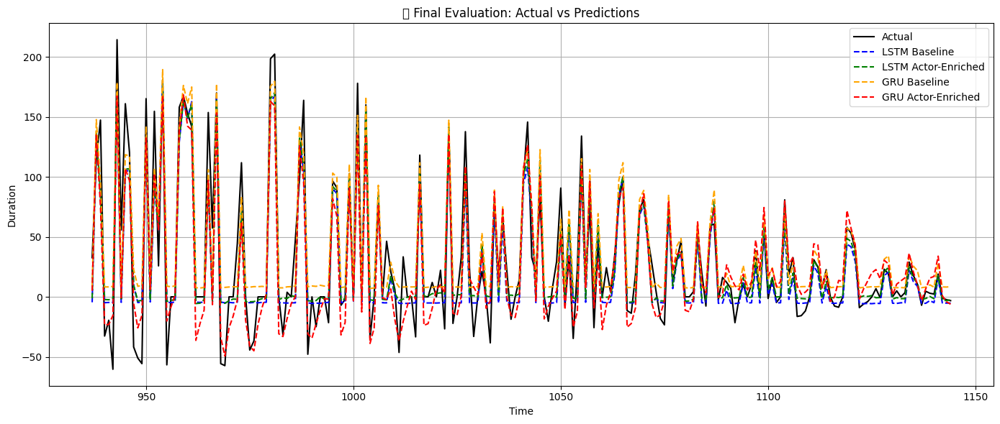


📊 Final Holdout Test Results Summary:
| Model   | RMSE Baseline   | RMSE Actor     |   RMSE Δ | MAE Baseline   | MAE Actor      |   MAE Δ | R² Baseline   | R² Actor      |   R² Δ |
|:--------|:----------------|:---------------|---------:|:---------------|:---------------|--------:|:--------------|:--------------|-------:|
| LSTM    | 23.017 ± 1.396  | 22.425 ± 1.398 |    0.592 | 16.537 ± 1.144 | 15.205 ± 1.176 |   1.332 | 0.838 ± 0.021 | 0.846 ± 0.021 |  0.008 |
| GRU     | 24.112 ± 1.399  | 22.450 ± 1.305 |    1.662 | 18.212 ± 1.120 | 17.198 ± 1.023 |   1.014 | 0.821 ± 0.026 | 0.845 ± 0.020 |  0.024 |
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━

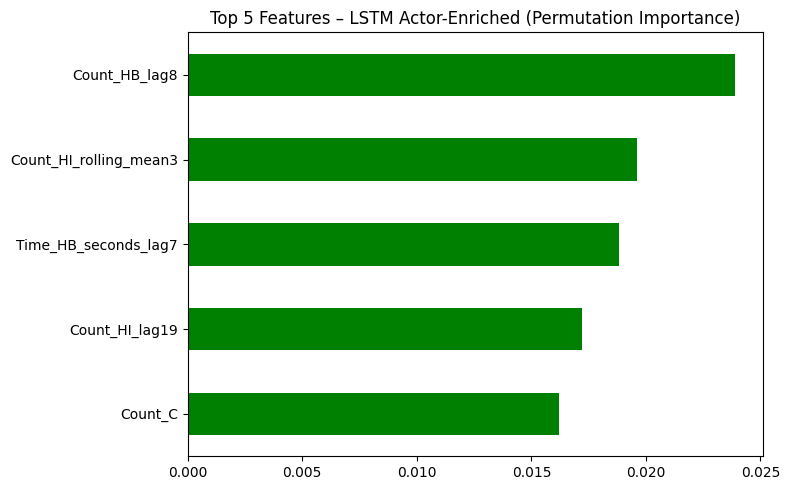

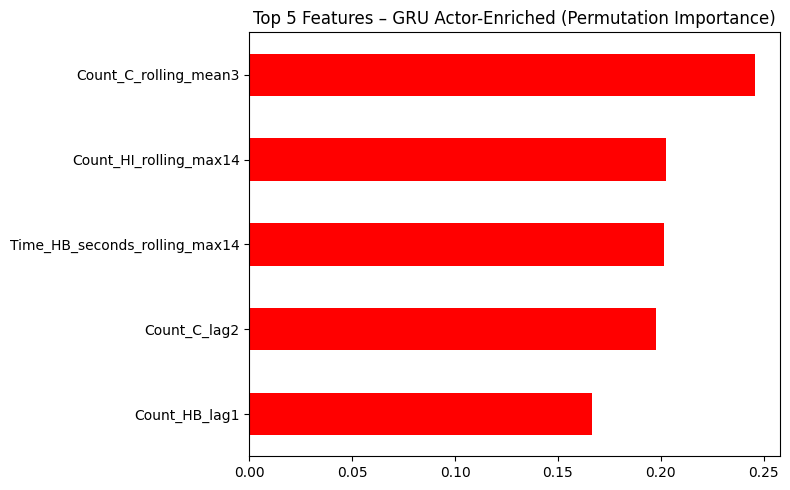


🔍 Top Features – LSTM Actor-Enriched (Δ RMSE):

|                        |    Δ RMSE |
|:-----------------------|----------:|
| Count_HB_lag8          | 0.0239068 |
| Count_HI_rolling_mean3 | 0.019624  |
| Time_HB_seconds_lag7   | 0.01882   |
| Count_HI_lag19         | 0.0172242 |
| Count_C                | 0.0162262 |

🔍 Top Features – GRU Actor-Enriched (Δ RMSE):

|                               |   Δ RMSE |
|:------------------------------|---------:|
| Count_C_rolling_mean3         | 0.245709 |
| Count_HI_rolling_max14        | 0.20243  |
| Time_HB_seconds_rolling_max14 | 0.201346 |
| Count_C_lag2                  | 0.197919 |
| Count_HB_lag1                 | 0.166582 |


In [13]:
# -------------------------------------------
# Seed Setup
# -------------------------------------------
def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

from sklearn.utils import resample

def bootstrap_metrics(y_true, y_pred, n_bootstrap=1000, seed=42):
    rmse_vals, mae_vals, r2_vals = [], [], []
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    n = len(y_true)

    rng = np.random.RandomState(seed)

    for _ in range(n_bootstrap):
        idx = rng.choice(n, n, replace=True)
        yt_bs = y_true[idx]
        yp_bs = y_pred[idx]
        rmse_vals.append(np.sqrt(mean_squared_error(yt_bs, yp_bs)))
        mae_vals.append(mean_absolute_error(yt_bs, yp_bs))
        r2_vals.append(r2_score(yt_bs, yp_bs))

    def summary(vals):
        return np.mean(vals), np.std(vals)

    return {
        'rmse': summary(rmse_vals),
        'mae': summary(mae_vals),
        'r2': summary(r2_vals)
    }


# -------------------------------------------
# Final Evaluation Function
# -------------------------------------------
def final_evaluate_rnn(df_train, df_test, features, rnn_type='gru', time_steps=15):
    context_window = 50  # Ensure enough rows for lag features
    df_context = pd.concat([df_train.tail(context_window), df_test])

    df_train_fe, _, _ = feature_engineering(df_train, residual_target=True)
    df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)

    # ✂️ Keep only rows from actual test period
    df_test_fe = df_test_fe.loc[df_test_fe.index.intersection(df_test.index)]
    df_train_fe.dropna(inplace=True)
    df_test_fe.dropna(inplace=True)

    # Scale features and target
    scaler_x = StandardScaler()
    scaler_y = StandardScaler()
    df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
    df_test_fe[features] = scaler_x.transform(df_test_fe[features])
    df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
    df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

    # Sequence creation
    X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
    X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

    # Match predicted output strictly to df_test index
    max_len = min(len(y_test), len(df_test))
    index_values = df_test.index[:max_len]
    base_values = df_test['TT'].iloc[:max_len].reset_index(drop=True)

    # Build model
    input_layer = Input(shape=(X_train.shape[1], X_train.shape[2]))
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)

    if rnn_type == 'lstm':
        x = Bidirectional(LSTM(128, return_sequences=True))(x)
        x = Dropout(0.2)(x)
        x = LSTM(32, return_sequences=True)(x)
    else:
        x = Bidirectional(GRU(128, return_sequences=True))(x)
        x = Dropout(0.2)(x)
        x = GRU(64, return_sequences=True)(x)

    x = Dropout(0.3)(x)
    x = MultiHeadAttention(num_heads=4, key_dim=32)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)

    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')

    callbacks = [
        EarlyStopping(patience=5, restore_best_weights=True),
        ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
    ]

    model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=100,
        batch_size=32,
        callbacks=callbacks,
        verbose=0
    )

    # Predict and inverse-transform
    y_pred_scaled = model.predict(X_test).flatten()
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

    # Trim to match index
    y_pred = y_pred[:max_len]
    y_test_inv = y_test_inv[:max_len]

    y_pred_final = base_values + y_pred
    y_true_final = base_values + y_test_inv

    rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
    mae = mean_absolute_error(y_true_final, y_pred_final)
    r2 = r2_score(y_true_final, y_pred_final)

    print(f"✅ Final Evaluation on df_test_final ({rnn_type.upper()}):")
    print(f"  RMSE: {rmse:.3f}")
    print(f"  MAE : {mae:.3f}")
    print(f"  R²  : {r2:.3f}")

    return {
    'index': index_values,
    'y_true': y_true_final,
    'y_pred': y_pred_final,
    'metrics': bootstrap_metrics(y_true_final, y_pred_final, seed=42),
    'model': model,
    'X_test': X_test,
    'y_test_true': y_test_inv,
    'y_test_scaled': y_test,
    'scaler_y': scaler_y,
    'features': features
}



def fmt(mean, std):
    return f"{mean:.3f} ± {std:.3f}"

# -------------------------------------------
# Final Test Set Evaluations
# -------------------------------------------
df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)
set_seed(42)
preds_final_lstm_b = final_evaluate_rnn(df_train_full, df_test_final, baseline_features, rnn_type='lstm')
preds_final_lstm_a = final_evaluate_rnn(df_train_full, df_test_final, baseline_features + actor_features, rnn_type='lstm')
preds_final_gru_b = final_evaluate_rnn(df_train_full, df_test_final, baseline_features, rnn_type='gru')
preds_final_gru_a = final_evaluate_rnn(df_train_full, df_test_final, baseline_features + actor_features, rnn_type='gru')

# -------------------------------------------
# Plot Predictions
# -------------------------------------------
plt.figure(figsize=(14, 6))
plt.plot(preds_final_lstm_b['index'], preds_final_lstm_b['y_true'], label='Actual', color='black')
plt.plot(preds_final_lstm_b['index'], preds_final_lstm_b['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_final_lstm_a['index'], preds_final_lstm_a['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_final_gru_b['index'], preds_final_gru_b['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_final_gru_a['index'], preds_final_gru_a['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.title("🔍 Final Evaluation: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------------------
# Final Metric Summary Table
# -------------------------------------------
def extract_metrics(metrics):
    rmse_m, rmse_s = metrics['rmse']
    mae_m, mae_s = metrics['mae']
    r2_m, r2_s = metrics['r2']
    return rmse_m, rmse_s, mae_m, mae_s, r2_m, r2_s

rb_lstm, rs_lstm, mb_lstm, ms_lstm, r2b_lstm, r2s_lstm = extract_metrics(preds_final_lstm_b['metrics'])
ra_lstm, ras_lstm, ma_lstm, mas_lstm, r2a_lstm, r2as_lstm = extract_metrics(preds_final_lstm_a['metrics'])
rb_gru, rs_gru, mb_gru, ms_gru, r2b_gru, r2s_gru = extract_metrics(preds_final_gru_b['metrics'])
ra_gru, ras_gru, ma_gru, mas_gru, r2a_gru, r2as_gru = extract_metrics(preds_final_gru_a['metrics'])

summary_test = pd.DataFrame([
    {
        'Model': 'LSTM',
        'RMSE Baseline': fmt(rb_lstm, rs_lstm),
        'RMSE Actor': fmt(ra_lstm, ras_lstm),
        'RMSE Δ': f"{rb_lstm - ra_lstm:.3f}",
        'MAE Baseline': fmt(mb_lstm, ms_lstm),
        'MAE Actor': fmt(ma_lstm, mas_lstm),
        'MAE Δ': f"{mb_lstm - ma_lstm:.3f}",
        'R² Baseline': fmt(r2b_lstm, r2s_lstm),
        'R² Actor': fmt(r2a_lstm, r2as_lstm),
        'R² Δ': f"{r2a_lstm - r2b_lstm:.3f}",
    },
    {
        'Model': 'GRU',
        'RMSE Baseline': fmt(rb_gru, rs_gru),
        'RMSE Actor': fmt(ra_gru, ras_gru),
        'RMSE Δ': f"{rb_gru - ra_gru:.3f}",
        'MAE Baseline': fmt(mb_gru, ms_gru),
        'MAE Actor': fmt(ma_gru, mas_gru),
        'MAE Δ': f"{mb_gru - ma_gru:.3f}",
        'R² Baseline': fmt(r2b_gru, r2s_gru),
        'R² Actor': fmt(r2a_gru, r2as_gru),
        'R² Δ': f"{r2a_gru - r2b_gru:.3f}",
    }
])

print("\n📊 Final Holdout Test Results Summary:")
print(summary_test.to_markdown(index=False))

def permutation_importance_rnn(model, X_val, y_val_true, y_val_scaled, scaler_y, features, n_repeats=5):
    importances = {}
    baseline_preds = model.predict(X_val).flatten()
    baseline_preds_inv = scaler_y.inverse_transform(baseline_preds.reshape(-1, 1)).flatten()
    baseline_rmse = np.sqrt(mean_squared_error(y_val_true, baseline_preds_inv))

    for i, feature in enumerate(features):
        permuted_rmses = []
        for _ in range(n_repeats):
            X_perm = X_val.copy()
            np.random.shuffle(X_perm[:, :, i])  # Permute values of feature i across time steps
            perm_preds = model.predict(X_perm).flatten()
            perm_preds_inv = scaler_y.inverse_transform(perm_preds.reshape(-1, 1)).flatten()
            perm_rmse = np.sqrt(mean_squared_error(y_val_true, perm_preds_inv))
            permuted_rmses.append(perm_rmse - baseline_rmse)
        importances[feature] = np.mean(permuted_rmses)

    return pd.Series(importances).sort_values(ascending=False)


# Run permutation importance for actor-enriched LSTM
fi_lstm_a = permutation_importance_rnn(
    preds_final_lstm_a['model'],
    preds_final_lstm_a['X_test'],
    preds_final_lstm_a['y_test_true'],
    preds_final_lstm_a['y_test_scaled'],
    preds_final_lstm_a['scaler_y'],
    preds_final_lstm_a['features']
)

# Run for GRU actor-enriched model
fi_gru_a = permutation_importance_rnn(
    preds_final_gru_a['model'],
    preds_final_gru_a['X_test'],
    preds_final_gru_a['y_test_true'],
    preds_final_gru_a['y_test_scaled'],
    preds_final_gru_a['scaler_y'],
    preds_final_gru_a['features']
)

# Plot top 5 for LSTM
plt.figure(figsize=(8, 5))
fi_lstm_a.head(5).plot(kind='barh', color='green')
plt.title("Top 5 Features – LSTM Actor-Enriched (Permutation Importance)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Plot top 5 for GRU
plt.figure(figsize=(8, 5))
fi_gru_a.head(5).plot(kind='barh', color='red')
plt.title("Top 5 Features – GRU Actor-Enriched (Permutation Importance)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

print("\n🔍 Top Features – LSTM Actor-Enriched (Δ RMSE):\n")
print(fi_lstm_a.head(5).to_frame("Δ RMSE").to_markdown())

print("\n🔍 Top Features – GRU Actor-Enriched (Δ RMSE):\n")
print(fi_gru_a.head(5).to_frame("Δ RMSE").to_markdown())




tuning

In [ ]:
import numpy as np
import pandas as pd
from itertools import product
import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv1D, MaxPooling1D, Bidirectional, GRU, LSTM, Dropout, MultiHeadAttention, LayerNormalization, GlobalAveragePooling1D, Dense)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import ttest_rel, sem, t

# Assume this function exists and works correctly
#from feature_engineering import feature_engineering

import os
import random

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)



def build_attention_model(input_shape, rnn_units=128, dense_units=64, dropout=0.3, rnn_type='gru'):
    input_layer = Input(shape=input_shape)
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(rnn_units, return_sequences=True) if rnn_type == 'gru' else LSTM(rnn_units, return_sequences=True))(x)
    x = Dropout(dropout)(x)
    x = (GRU(dense_units, return_sequences=True) if rnn_type == 'gru' else LSTM(dense_units, return_sequences=True))(x)
    x = Dropout(dropout)(x)
    x = MultiHeadAttention(num_heads=4, key_dim=32)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)
    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')
    return model


def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)


def train_attention_rnn(df, features, rnn_type='gru', time_steps=15, n_splits=5, custom_params=None):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"\n🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        if len(X_train) == 0 or len(X_test) == 0:
          print(f"⚠️ Skipping Fold {fold + 1}: Insufficient data after sequence creation.")
          continue


        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        model = build_attention_model(
            input_shape=(X_train.shape[1], X_train.shape[2]),
            rnn_units=custom_params.get('rnn_units', 128),
            dense_units=custom_params.get('dense_units', 64),
            dropout=custom_params.get('dropout', 0.3),
            rnn_type=rnn_type
        )

        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]

        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=custom_params.get('batch_size', 16),
                  callbacks=callbacks, verbose=0)

        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

    return rmse_list, mae_list


# Load data
print("\n📦 Loading data and setting up parameter grid")
df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)

param_grid = {
    'rnn_units': [64, 128, 256, 512],
    'dense_units': [32, 64, 128, 256],
    'dropout': [0.2, 0.3],
    'batch_size': [16, 32]
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

results_summary = []


for i, combo in enumerate(param_combos):
    set_seed(42)
    params = dict(zip(param_names, combo))
    print(f"\n\n🔧 Config {i+1}/{len(param_combos)}: {params}")

    rmse_b, mae_b = train_attention_rnn(df, baseline_features, rnn_type='gru', custom_params=params)
    rmse_a, mae_a = train_attention_rnn(df, baseline_features + actor_features, rnn_type='gru', custom_params=params)

    delta = np.mean(rmse_b) - np.mean(rmse_a)
    results_summary.append({
        'params': params,
        'rmse_baseline': np.mean(rmse_b),
        'rmse_actor': np.mean(rmse_a),
        'delta': delta,
        'outperforms': delta > 0
    })

    print(f"✅ Δ RMSE = {delta:.4f} | {'Actor Wins ✅' if delta > 0 else 'Baseline Wins ❌'}")

# Summary
summary_df = pd.DataFrame(results_summary).sort_values(by='delta', ascending=False)
print("\n\n📋 Final Results Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


In [ ]:
print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))
#choose mostly appearing configurations -> rnn_units 64 , dense 32, dropout 0.2 batch size 32

In [ ]:
from itertools import product
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv1D, MaxPooling1D, Bidirectional,
    GRU, LSTM, Dropout, MultiHeadAttention, LayerNormalization,
    GlobalAveragePooling1D, Dense
)

import os
import random

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

# === Build Model Function (for both GRU and LSTM) ===
def build_attention_model(input_shape, rnn_units=128, dense_units=64, dropout=0.3, rnn_type='lstm'):
    input_layer = Input(shape=input_shape)
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(LSTM(rnn_units, return_sequences=True))(x) if rnn_type == 'lstm' else Bidirectional(GRU(rnn_units, return_sequences=True))(x)
    x = Dropout(dropout)(x)
    x = LSTM(dense_units, return_sequences=True)(x) if rnn_type == 'lstm' else GRU(dense_units, return_sequences=True)(x)
    x = Dropout(dropout)(x)
    x = MultiHeadAttention(num_heads=4, key_dim=32)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)
    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')
    return model

# === Sequence Creator ===
def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

# === Training Function ===
def train_attention_rnn(df, features, rnn_type='lstm', time_steps=15, n_splits=5, custom_params=None):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"\n🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        if len(X_train) == 0 or len(X_test) == 0:
          print(f"⚠️ Skipping Fold {fold + 1}: Insufficient data after sequence creation.")
          continue
        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        model = build_attention_model(
            input_shape=(X_train.shape[1], X_train.shape[2]),
            rnn_units=custom_params.get('rnn_units', 128),
            dense_units=custom_params.get('dense_units', 64),
            dropout=custom_params.get('dropout', 0.3),
            rnn_type='lstm'  # ✅ Force LSTM
        )

        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]

        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=custom_params.get('batch_size', 16),
                  callbacks=callbacks, verbose=0)

        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

    return rmse_list, mae_list

# === Run LSTM Grid Search ===
print("\n📦 Running LSTM hyperparameter tuning")

df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)

param_grid = {
    'rnn_units': [64, 128, 256, 512],
    'dense_units': [32, 64, 128, 256],
    'dropout': [0.2, 0.3],
    'batch_size': [16, 32]
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

results_summary = []

for i, combo in enumerate(param_combos):
    set_seed(42)
    params = dict(zip(param_names, combo))
    print(f"\n\n🔧 Config {i+1}/{len(param_combos)} | Params: {params}")

    rmse_b, mae_b = train_attention_rnn(df, baseline_features, rnn_type='lstm', custom_params=params)
    rmse_a, mae_a = train_attention_rnn(df, baseline_features + actor_features, rnn_type='lstm', custom_params=params)

    delta = np.mean(rmse_b) - np.mean(rmse_a)
    results_summary.append({
        'params': params,
        'rmse_baseline': np.mean(rmse_b),
        'rmse_actor': np.mean(rmse_a),
        'delta': delta,
        'outperforms': delta > 0
    })

    print(f"✅ Δ RMSE = {delta:.4f} | {'Actor Wins ✅' if delta > 0 else 'Baseline Wins ❌'}")

# === Print Summary ===
summary_df = pd.DataFrame(results_summary).sort_values(by='delta', ascending=False)
print("\n\n📋 LSTM Tuning Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Actor-Enriched configurations that outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


In [ ]:
print("\n✅ Actor-Enriched configurations that outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))
#choose mostly appearing configurations -> rnn_units 64 , dense 32, dropout 0.2 batch size 32

# RNN without attention

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import (
    LSTM, GRU, Dense, Dropout, Input, Bidirectional,
    Conv1D, MaxPooling1D, GlobalAveragePooling1D,
    LayerNormalization, MultiHeadAttention
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

import os
import random

/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons


🔵 LSTM (Baseline)
🔁 Fold 1


/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_max{window}'] = df_model[var].rolling(window).max().shift(1)
/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 434ms/step
🔁 Fold 2


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 397ms/step
🔁 Fold 3


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 407ms/step
🔁 Fold 4


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 389ms/step
🔁 Fold 5


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 417ms/step
🟢 LSTM (Actor-Enriched)
🔁 Fold 1


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 397ms/step
🔁 Fold 2


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 426ms/step
🔁 Fold 3


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 416ms/step
🔁 Fold 4


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 415ms/step
🔁 Fold 5


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 434ms/step
🟠 GRU (Baseline)
🔁 Fold 1


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 478ms/step
🔁 Fold 2


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
🔁 Fold 3


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 472ms/step
🔁 Fold 4


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step
🔁 Fold 5


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 478ms/step
🔴 GRU (Actor-Enriched)
🔁 Fold 1


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step
🔁 Fold 2


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 473ms/step
🔁 Fold 3


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 485ms/step
🔁 Fold 4


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 480ms/step
🔁 Fold 5


/tmp/ipython-input-6-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-6-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-6-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 474ms/step

📊 Final Model Comparison Table:
|    | Model   | RMSE Baseline   | RMSE Actor     |   RMSE Δ | MAE Baseline   | MAE Actor      |   MAE Δ |   p-value (RMSE) |   Cohen’s d |
|---:|:--------|:----------------|:---------------|---------:|:---------------|:---------------|--------:|-----------------:|------------:|
|  0 | LSTM    | 16.839 ± 3.996  | 19.105 ± 6.140 |   -2.267 | 13.231 ± 3.296 | 15.047 ± 5.707 |  -1.816 |           0.2527 |      -0.597 |
|  1 | GRU     | 17.442 ± 4.657  | 18.884 ± 6.548 |   -1.441 | 13.628 ± 4.013 | 15.171 ± 6.118 |  -1.543 |           0.3425 |      -0.481 |

📌 LSTM Summary
  RMSE Baseline: 16.839 ± 3.996
  RMSE Actor: 19.105 ± 6.140
  RMSE Δ: -2.267
  MAE Baseline: 13.231 ± 3.296
  MAE Actor: 15.047 ± 5.707
  MAE Δ: -1.816
  p-value (RMSE): 0.2527
  Cohen’s d: -0.597

📌 GRU Summary
  RMSE Baseline: 17.442 ± 4.657
  RMSE Actor: 18.884 ± 6.548
  RMSE Δ: -1.441
  MAE Baseline: 13.628 ± 4.013
  MAE Actor: 15.171 ± 6.118
  

/tmp/ipython-input-10-2918452237.py:212: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


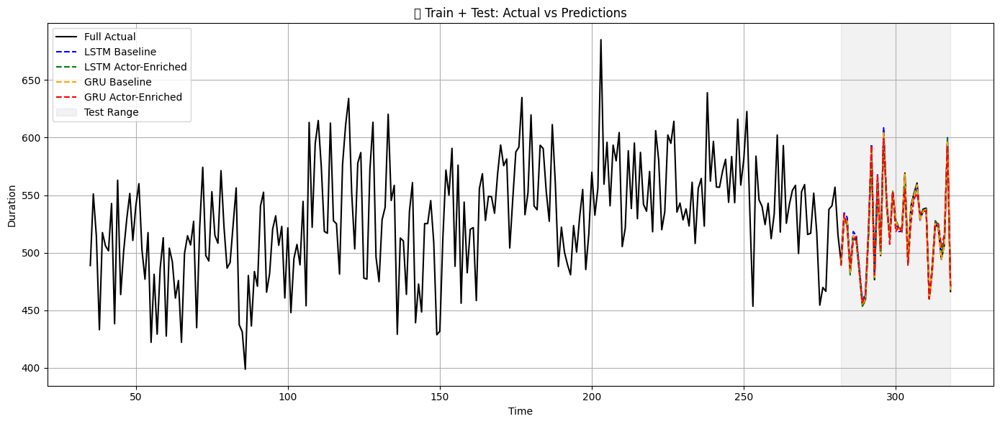

/tmp/ipython-input-10-2918452237.py:229: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


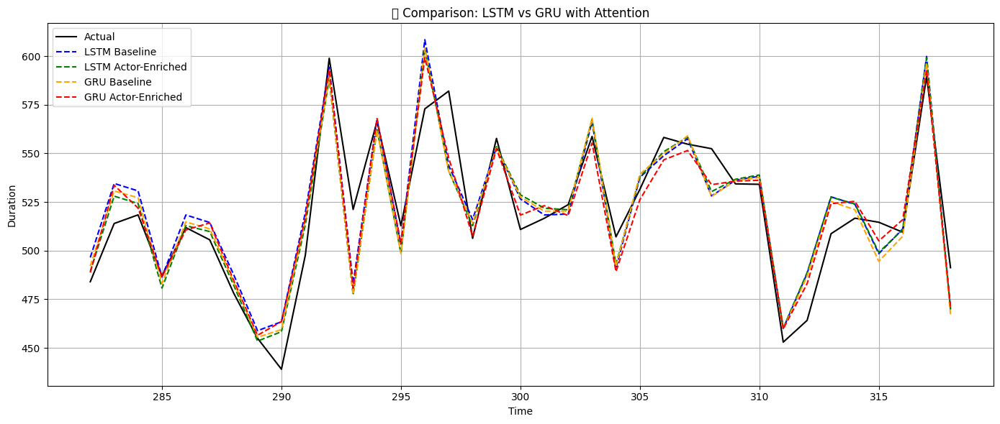

In [ ]:
#RNN without attention.py

#from feature_engineering import feature_engineering

# -----------------------------
# 🧱 Helper Functions
# -----------------------------

import os
import random

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

def cohen_d(x, y):
    diff = np.array(x) - np.array(y)
    return diff.mean() / diff.std(ddof=1)

def confidence_interval(data, confidence=0.95):
    m = np.mean(data)
    se = sem(data)
    h = se * t.ppf((1 + confidence) / 2., len(data)-1)
    return f"{m:.3f} ± {h:.3f}"

def summarize_model_comparison(name, rmse_b, rmse_a, mae_b, mae_a):
    stat, p_rmse = ttest_rel(rmse_b, rmse_a)

    rmse_improvement = np.mean(rmse_b) - np.mean(rmse_a)
    mae_improvement = np.mean(mae_b) - np.mean(mae_a)

    return {
        'Model': name,
        'RMSE Baseline': confidence_interval(rmse_b),
        'RMSE Actor': confidence_interval(rmse_a),
        'RMSE Δ': f"{rmse_improvement:.3f}",  # ← RMSE improvement
        'MAE Baseline': confidence_interval(mae_b),
        'MAE Actor': confidence_interval(mae_a),
        'MAE Δ': f"{mae_improvement:.3f}",    # ← MAE improvement
        'p-value (RMSE)': f"{p_rmse:.4f}",
        'Cohen’s d': f"{cohen_d(rmse_b, rmse_a):.3f}"
    }

def train_attention_rnn(df, features, rnn_type='gru', time_steps=15, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []
    final_preds = None

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        # ✅ Feature engineering inside fold (no leakage)
        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        # Scaling
        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        # Sequence data
        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        # Build model
        input_layer = Input(shape=(X_train.shape[1], X_train.shape[2]))
        x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
        x = MaxPooling1D(pool_size=2)(x)
        x = Bidirectional(GRU(128, return_sequences=True) if rnn_type == 'gru' else LSTM(128, return_sequences=True))(x)
        x = Dropout(0.3)(x)

        x = GlobalAveragePooling1D()(x)
        x = Dense(32, activation='relu')(x)  # dense_units = 32
        output = Dense(1)(x)
        model = Model(inputs=input_layer, outputs=output)


        model.compile(optimizer='adam', loss='mse')
        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]
        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=32, callbacks=callbacks, verbose=0)

        # Predictions
        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

        if fold == n_splits - 1:
            final_preds = {
                'index': df_test_fe.index[time_steps + 1: time_steps + 1 + len(y_pred)],
                'y_true': y_true_final,
                'y_pred': y_pred_final
            }

    return rmse_list, mae_list, final_preds
# -------------------------
# 🚀 Train All RNN Models
# -------------------------
df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)
set_seed(42)

print("\n🔵 LSTM (Baseline)")
rmse_b_lstm, mae_b_lstm, preds_b_lstm = train_attention_rnn(df, baseline_features, rnn_type='lstm')

print("🟢 LSTM (Actor-Enriched)")
rmse_a_lstm, mae_a_lstm, preds_a_lstm = train_attention_rnn(df, baseline_features + actor_features, rnn_type='lstm')

print("🟠 GRU (Baseline)")
rmse_b_gru, mae_b_gru, preds_b_gru = train_attention_rnn(df, baseline_features, rnn_type='gru')

print("🔴 GRU (Actor-Enriched)")
rmse_a_gru, mae_a_gru, preds_a_gru = train_attention_rnn(df, baseline_features + actor_features, rnn_type='gru')

# ===============================
# 📊 Add RNN Results to Global Table
# ===============================
results = [] if 'results' not in globals() else results

results.append(summarize_model_comparison("LSTM", rmse_b_lstm, rmse_a_lstm, mae_b_lstm, mae_a_lstm))
results.append(summarize_model_comparison("GRU", rmse_b_gru, rmse_a_gru, mae_b_gru, mae_a_gru))

# 📊 Show updated comparison
results_df = pd.DataFrame(results)
print("\n📊 Final Model Comparison Table:")
print(results_df.to_markdown())


# ===============================
# 📊 Final Report
# ===============================
for r in results[-2:]:
    print(f"\n📌 {r['Model']} Summary")
    for k, v in r.items():
        if k != 'Model':
            print(f"  {k}: {v}")

# Optional final full table
if len(results) > 1:
    results_df = pd.DataFrame(results)
    print("\n📊 Final Model Comparison Table:")
    print(results_df.to_markdown())

# ===============================
# 📈 Plot Actual vs Predictions
# ===============================
plt.figure(figsize=(14, 6))
time_steps = 15
plt.plot(df_model.index[time_steps:], df_model['TT'].values[time_steps:], label='Full Actual', color='black')
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_a_lstm['index'], preds_a_lstm['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_b_gru['index'], preds_b_gru['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_a_gru['index'], preds_a_gru['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.axvspan(preds_b_lstm['index'][0], preds_b_lstm['index'][-1], color='gray', alpha=0.1, label='Test Range')
plt.title("📈 Train + Test: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ===============================
# 📉 Overlay Plot
# ===============================
plt.figure(figsize=(14, 6))
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_true'], label='Actual', color='black')
plt.plot(preds_b_lstm['index'], preds_b_lstm['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_a_lstm['index'], preds_a_lstm['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_b_gru['index'], preds_b_gru['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_a_gru['index'], preds_a_gru['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.title("📈 Comparison: LSTM vs GRU with Attention")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
✅ Final Evaluation on df_test_final (LSTM):
  RMSE: 18.051
  MAE : 14.874
  R²  : 0.901


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step
✅ Final Evaluation on df_test_final (LSTM):
  RMSE: 19.360
  MAE : 13.722
  R²  : 0.886


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 218ms/step
✅ Final Evaluation on df_test_final (GRU):
  RMSE: 26.157
  MAE : 21.467
  R²  : 0.793


/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step
✅ Final Evaluation on df_test_final (GRU):
  RMSE: 25.063
  MAE : 19.316
  R²  : 0.810


/tmp/ipython-input-19-2047506085.py:174: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


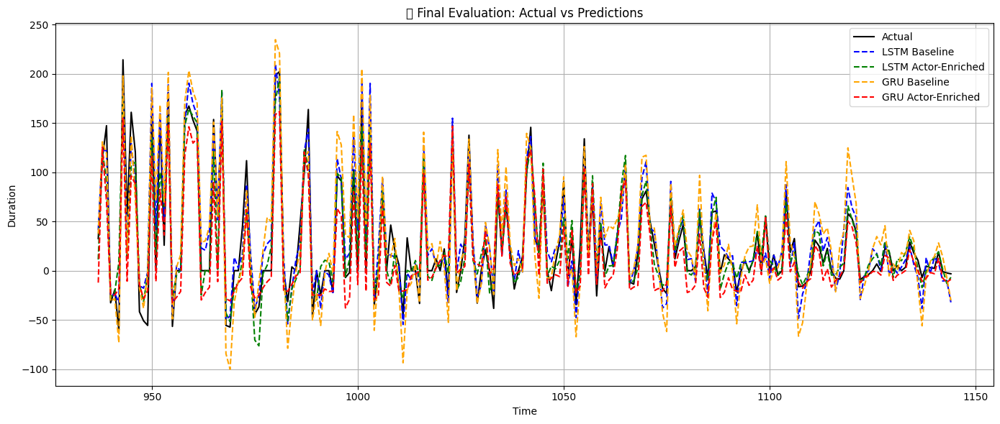


📊 Final Holdout Test Results Summary:
| Model   | RMSE Baseline   | RMSE Actor     |   RMSE Δ | MAE Baseline   | MAE Actor      |   MAE Δ | R² Baseline   | R² Actor      |   R² Δ |
|:--------|:----------------|:---------------|---------:|:---------------|:---------------|--------:|:--------------|:--------------|-------:|
| LSTM    | 18.021 ± 0.780  | 22.425 ± 1.398 |   -4.405 | 14.865 ± 0.694 | 15.205 ± 1.176 |  -0.34  | 0.900 ± 0.014 | 0.846 ± 0.021 | -0.054 |
| GRU     | 24.112 ± 1.399  | 22.450 ± 1.305 |    1.662 | 18.212 ± 1.120 | 17.198 ± 1.023 |   1.014 | 0.821 ± 0.026 | 0.845 ± 0.020 |  0.024 |


In [ ]:

# -------------------------------------------
# Seed Setup
# -------------------------------------------
def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

from sklearn.utils import resample

def bootstrap_metrics(y_true, y_pred, n_bootstrap=1000, seed=42):
    rmse_vals, mae_vals, r2_vals = [], [], []
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    n = len(y_true)

    rng = np.random.RandomState(seed)

    for _ in range(n_bootstrap):
        idx = rng.choice(n, n, replace=True)
        yt_bs = y_true[idx]
        yp_bs = y_pred[idx]
        rmse_vals.append(np.sqrt(mean_squared_error(yt_bs, yp_bs)))
        mae_vals.append(mean_absolute_error(yt_bs, yp_bs))
        r2_vals.append(r2_score(yt_bs, yp_bs))

    def summary(vals):
        return np.mean(vals), np.std(vals)

    return {
        'rmse': summary(rmse_vals),
        'mae': summary(mae_vals),
        'r2': summary(r2_vals)
    }


# -------------------------------------------
# Final Evaluation Function
# -------------------------------------------
def final_evaluate_rnn(df_train, df_test, features, rnn_type='gru', time_steps=15):
    context_window = 50  # Ensure enough rows for lag features
    df_context = pd.concat([df_train.tail(context_window), df_test])

    df_train_fe, _, _ = feature_engineering(df_train, residual_target=True)
    df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)

    # ✂️ Keep only rows from actual test period
    df_test_fe = df_test_fe.loc[df_test_fe.index.intersection(df_test.index)]
    df_train_fe.dropna(inplace=True)
    df_test_fe.dropna(inplace=True)

    # Scale features and target
    scaler_x = StandardScaler()
    scaler_y = StandardScaler()
    df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
    df_test_fe[features] = scaler_x.transform(df_test_fe[features])
    df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
    df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

    # Sequence creation
    X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
    X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

    # Match predicted output strictly to df_test index
    max_len = min(len(y_test), len(df_test))
    index_values = df_test.index[:max_len]
    base_values = df_test['TT'].iloc[:max_len].reset_index(drop=True)

    # Build model
    input_layer = Input(shape=(X_train.shape[1], X_train.shape[2]))
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)

    if rnn_type == 'lstm':
        x = Bidirectional(LSTM(512, return_sequences=True))(x)
        x = Dropout(0.3)(x)
        x = LSTM(128, return_sequences=True)(x)
    else:
        x = Bidirectional(GRU(256, return_sequences=True))(x)
        x = Dropout(0.3)(x)
        x = GRU(128, return_sequences=True)(x)


    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)

    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')

    callbacks = [
        EarlyStopping(patience=5, restore_best_weights=True),
        ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
    ]

    model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=100,
        batch_size=32,
        callbacks=callbacks,
        verbose=0
    )

    # Predict and inverse-transform
    y_pred_scaled = model.predict(X_test).flatten()
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

    # Trim to match index
    y_pred = y_pred[:max_len]
    y_test_inv = y_test_inv[:max_len]

    y_pred_final = base_values + y_pred
    y_true_final = base_values + y_test_inv

    rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
    mae = mean_absolute_error(y_true_final, y_pred_final)
    r2 = r2_score(y_true_final, y_pred_final)

    print(f"✅ Final Evaluation on df_test_final ({rnn_type.upper()}):")
    print(f"  RMSE: {rmse:.3f}")
    print(f"  MAE : {mae:.3f}")
    print(f"  R²  : {r2:.3f}")


    return {
    'index': index_values,
    'y_true': y_true_final,
    'y_pred': y_pred_final,
    'metrics': bootstrap_metrics(y_true_final, y_pred_final, seed=42)
    }


def fmt(mean, std):
    return f"{mean:.3f} ± {std:.3f}"

# -------------------------------------------
# Final Test Set Evaluations
# -------------------------------------------
df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)
set_seed(42)
preds_final_lstm_b_noatt = final_evaluate_rnn(df_train_full, df_test_final, baseline_features, rnn_type='lstm')
preds_final_lstm_a_noatt = final_evaluate_rnn(df_train_full, df_test_final, baseline_features + actor_features, rnn_type='lstm')
preds_final_gru_b_noatt = final_evaluate_rnn(df_train_full, df_test_final, baseline_features, rnn_type='gru')
preds_final_gru_a_noatt = final_evaluate_rnn(df_train_full, df_test_final, baseline_features + actor_features, rnn_type='gru')

# -------------------------------------------
# Plot Predictions
# -------------------------------------------
plt.figure(figsize=(14, 6))
plt.plot(preds_final_lstm_b_noatt['index'], preds_final_lstm_b_noatt['y_true'], label='Actual', color='black')
plt.plot(preds_final_lstm_b_noatt['index'], preds_final_lstm_b_noatt['y_pred'], '--', label='LSTM Baseline', color='blue')
plt.plot(preds_final_lstm_a_noatt['index'], preds_final_lstm_a_noatt['y_pred'], '--', label='LSTM Actor-Enriched', color='green')
plt.plot(preds_final_gru_b_noatt['index'], preds_final_gru_b_noatt['y_pred'], '--', label='GRU Baseline', color='orange')
plt.plot(preds_final_gru_a_noatt['index'], preds_final_gru_a_noatt['y_pred'], '--', label='GRU Actor-Enriched', color='red')
plt.title("🔍 Final Evaluation: Actual vs Predictions")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------------------
# Final Metric Summary Table
# -------------------------------------------
def extract_metrics(metrics):
    rmse_m, rmse_s = metrics['rmse']
    mae_m, mae_s = metrics['mae']
    r2_m, r2_s = metrics['r2']
    return rmse_m, rmse_s, mae_m, mae_s, r2_m, r2_s

rb_lstm, rs_lstm, mb_lstm, ms_lstm, r2b_lstm, r2s_lstm = extract_metrics(preds_final_lstm_b['metrics'])
ra_lstm, ras_lstm, ma_lstm, mas_lstm, r2a_lstm, r2as_lstm = extract_metrics(preds_final_lstm_a['metrics'])
rb_gru, rs_gru, mb_gru, ms_gru, r2b_gru, r2s_gru = extract_metrics(preds_final_gru_b['metrics'])
ra_gru, ras_gru, ma_gru, mas_gru, r2a_gru, r2as_gru = extract_metrics(preds_final_gru_a['metrics'])

summary_test = pd.DataFrame([
    {
        'Model': 'LSTM',
        'RMSE Baseline': fmt(rb_lstm, rs_lstm),
        'RMSE Actor': fmt(ra_lstm, ras_lstm),
        'RMSE Δ': f"{rb_lstm - ra_lstm:.3f}",
        'MAE Baseline': fmt(mb_lstm, ms_lstm),
        'MAE Actor': fmt(ma_lstm, mas_lstm),
        'MAE Δ': f"{mb_lstm - ma_lstm:.3f}",
        'R² Baseline': fmt(r2b_lstm, r2s_lstm),
        'R² Actor': fmt(r2a_lstm, r2as_lstm),
        'R² Δ': f"{r2a_lstm - r2b_lstm:.3f}",
    },
    {
        'Model': 'GRU',
        'RMSE Baseline': fmt(rb_gru, rs_gru),
        'RMSE Actor': fmt(ra_gru, ras_gru),
        'RMSE Δ': f"{rb_gru - ra_gru:.3f}",
        'MAE Baseline': fmt(mb_gru, ms_gru),
        'MAE Actor': fmt(ma_gru, mas_gru),
        'MAE Δ': f"{mb_gru - ma_gru:.3f}",
        'R² Baseline': fmt(r2b_gru, r2s_gru),
        'R² Actor': fmt(r2a_gru, r2as_gru),
        'R² Δ': f"{r2a_gru - r2b_gru:.3f}",
    }
])

print("\n📊 Final Holdout Test Results Summary:")
print(summary_test.to_markdown(index=False))


tuning

In [ ]:
import numpy as np
import pandas as pd
from itertools import product
import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv1D, MaxPooling1D, Bidirectional, GRU, LSTM, Dropout, MultiHeadAttention, LayerNormalization, GlobalAveragePooling1D, Dense)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import ttest_rel, sem, t

# Assume this function exists and works correctly
#from feature_engineering import feature_engineering

import os
import random

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)



def build_attention_model(input_shape, rnn_units=128, dense_units=64, dropout=0.3, rnn_type='gru'):
    input_layer = Input(shape=input_shape)
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(rnn_units, return_sequences=True) if rnn_type == 'gru' else LSTM(rnn_units, return_sequences=True))(x)
    x = Dropout(dropout)(x)
    x = (GRU(dense_units, return_sequences=True) if rnn_type == 'gru' else LSTM(dense_units, return_sequences=True))(x)

    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)
    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')
    return model


def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)


def train_attention_rnn(df, features, rnn_type='gru', time_steps=15, n_splits=5, custom_params=None):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"\n🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        if len(X_train) == 0 or len(X_test) == 0:
          print(f"⚠️ Skipping Fold {fold + 1}: Insufficient data after sequence creation.")
          continue

        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        model = build_attention_model(
            input_shape=(X_train.shape[1], X_train.shape[2]),
            rnn_units=custom_params.get('rnn_units', 128),
            dense_units=custom_params.get('dense_units', 64),
            dropout=custom_params.get('dropout', 0.3),
            rnn_type=rnn_type
        )

        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]

        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=custom_params.get('batch_size', 16),
                  callbacks=callbacks, verbose=0)

        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

    return rmse_list, mae_list


# Load data
print("\n📦 Loading data and setting up parameter grid")
df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)

param_grid = {
    'rnn_units': [64, 128, 256, 512],
    'dense_units': [32, 64, 128, 256],
    'dropout': [0.2, 0.3],
    'batch_size': [16, 32]
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

results_summary = []

for i, combo in enumerate(param_combos):
    set_seed(42)
    params = dict(zip(param_names, combo))
    print(f"\n\n🔧 Config {i+1}/{len(param_combos)}: {params}")

    rmse_b, mae_b = train_attention_rnn(df, baseline_features, rnn_type='gru', custom_params=params)
    rmse_a, mae_a = train_attention_rnn(df, baseline_features + actor_features, rnn_type='gru', custom_params=params)

    delta = np.mean(rmse_b) - np.mean(rmse_a)
    results_summary.append({
        'params': params,
        'rmse_baseline': np.mean(rmse_b),
        'rmse_actor': np.mean(rmse_a),
        'delta': delta,
        'outperforms': delta > 0
    })

    print(f"✅ Δ RMSE = {delta:.4f} | {'Actor Wins ✅' if delta > 0 else 'Baseline Wins ❌'}")

# Summary
summary_df = pd.DataFrame(results_summary).sort_values(by='delta', ascending=False)
print("\n\n📋 Final Results Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


In [ ]:
print("\n✅ Configurations where Actor-Enriched outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))
#choose mostly appearing configurations -> rnn_units 64 , dense 32, dropout 0.2 batch size 32

In [ ]:
from itertools import product
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv1D, MaxPooling1D, Bidirectional,
    GRU, LSTM, Dropout, MultiHeadAttention, LayerNormalization,
    GlobalAveragePooling1D, Dense
)

import os
import random

def set_seed(seed=42):
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    tf.config.experimental.enable_op_determinism()

set_seed(42)

# === Build Model Function (for both GRU and LSTM) ===
def build_attention_model(input_shape, rnn_units=128, dense_units=64, dropout=0.3, rnn_type='lstm'):
    input_layer = Input(shape=input_shape)
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(input_layer)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(LSTM(rnn_units, return_sequences=True))(x) if rnn_type == 'lstm' else Bidirectional(GRU(rnn_units, return_sequences=True))(x)
    x = Dropout(dropout)(x)
    x = LSTM(dense_units, return_sequences=True)(x) if rnn_type == 'lstm' else GRU(dense_units, return_sequences=True)(x)

    x = GlobalAveragePooling1D()(x)
    output = Dense(1)(x)
    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer='adam', loss='mse')
    return model

# === Sequence Creator ===
def create_seq_data(df, features, time_steps=15, target_col='target'):
    X, y = [], []
    for i in range(time_steps, len(df) - 1):
        X.append(df[features].iloc[i - time_steps:i].values)
        y.append(df[target_col].iloc[i + 1])
    return np.array(X), np.array(y)

# === Training Function ===
def train_attention_rnn(df, features, rnn_type='lstm', time_steps=15, n_splits=5, custom_params=None):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_list, mae_list = [], []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(df)):
        print(f"\n🔁 Fold {fold + 1}")

        df_train_raw = df.iloc[:test_idx[0]].copy()
        df_test_raw = df.iloc[test_idx].copy()

        df_train_fe, _, _ = feature_engineering(df_train_raw, residual_target=True)
        df_context = pd.concat([df_train_raw.tail(40), df_test_raw])
        df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
        df_test_fe = df_test_fe.loc[df_test_raw.index.intersection(df_test_fe.index)]

        df_train_fe.dropna(inplace=True)
        df_test_fe.dropna(inplace=True)

        scaler_x = StandardScaler()
        scaler_y = StandardScaler()
        df_train_fe[features] = scaler_x.fit_transform(df_train_fe[features])
        df_test_fe[features] = scaler_x.transform(df_test_fe[features])
        df_train_fe['target_scaled'] = scaler_y.fit_transform(df_train_fe[['target']])
        df_test_fe['target_scaled'] = scaler_y.transform(df_test_fe[['target']])

        X_train, y_train = create_seq_data(df_train_fe, features, time_steps, 'target_scaled')
        X_test, y_test = create_seq_data(df_test_fe, features, time_steps, 'target_scaled')

        if len(X_train) == 0 or len(X_test) == 0:
          print(f"⚠️ Skipping Fold {fold + 1}: Insufficient data after sequence creation.")
          continue
        base_values = df_test_fe['TT'].iloc[time_steps + 1: time_steps + 1 + len(y_test)].reset_index(drop=True)

        model = build_attention_model(
            input_shape=(X_train.shape[1], X_train.shape[2]),
            rnn_units=custom_params.get('rnn_units', 128),
            dense_units=custom_params.get('dense_units', 64),
            dropout=custom_params.get('dropout', 0.3),
            rnn_type='lstm'  # ✅ Force LSTM
        )

        callbacks = [
            EarlyStopping(patience=5, restore_best_weights=True),
            ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-5)
        ]

        model.fit(X_train, y_train, validation_data=(X_test, y_test),
                  epochs=100, batch_size=custom_params.get('batch_size', 16),
                  callbacks=callbacks, verbose=0)

        y_pred_scaled = model.predict(X_test).flatten()
        y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
        y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

        y_pred_final = base_values + y_pred
        y_true_final = base_values + y_test_inv

        rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
        mae = mean_absolute_error(y_true_final, y_pred_final)
        rmse_list.append(rmse)
        mae_list.append(mae)

    return rmse_list, mae_list

# === Run LSTM Grid Search ===
print("\n📦 Running LSTM hyperparameter tuning")

df = df_train_full.copy()
df_model, baseline_features, actor_features = feature_engineering(df, residual_target=True)

param_grid = {
    'rnn_units': [64, 128, 256, 512],
    'dense_units': [32, 64, 128, 256],
    'dropout': [0.2, 0.3],
    'batch_size': [16, 32]
}
param_combos = list(product(*param_grid.values()))
param_names = list(param_grid.keys())

results_summary = []

for i, combo in enumerate(param_combos):
    set_seed(42)
    params = dict(zip(param_names, combo))
    print(f"\n\n🔧 Config {i+1}/{len(param_combos)} | Params: {params}")

    rmse_b, mae_b = train_attention_rnn(df, baseline_features, rnn_type='lstm', custom_params=params)
    rmse_a, mae_a = train_attention_rnn(df, baseline_features + actor_features, rnn_type='lstm', custom_params=params)

    delta = np.mean(rmse_b) - np.mean(rmse_a)
    results_summary.append({
        'params': params,
        'rmse_baseline': np.mean(rmse_b),
        'rmse_actor': np.mean(rmse_a),
        'delta': delta,
        'outperforms': delta > 0
    })

    print(f"✅ Δ RMSE = {delta:.4f} | {'Actor Wins ✅' if delta > 0 else 'Baseline Wins ❌'}")

# === Print Summary ===
summary_df = pd.DataFrame(results_summary).sort_values(by='delta', ascending=False)
print("\n\n📋 LSTM Tuning Summary:")
print(summary_df[['params', 'rmse_baseline', 'rmse_actor', 'delta', 'outperforms']].to_markdown(index=False))

print("\n✅ Actor-Enriched configurations that outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))


In [ ]:
print("\n✅ Actor-Enriched configurations that outperformed Baseline:")
print(summary_df[summary_df['outperforms']][['params', 'rmse_baseline', 'rmse_actor', 'delta']].to_markdown(index=False))
#choose mostly appearing configurations -> rnn_units 64 , dense 32, dropout 0.2 batch size 32

# Final PLot

In [ ]:
pred_b_lgbm = final_model_b.predict(X_test_b) + base_values
pred_a_lgbm = final_model_a.predict(X_test_a) + base_values


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6


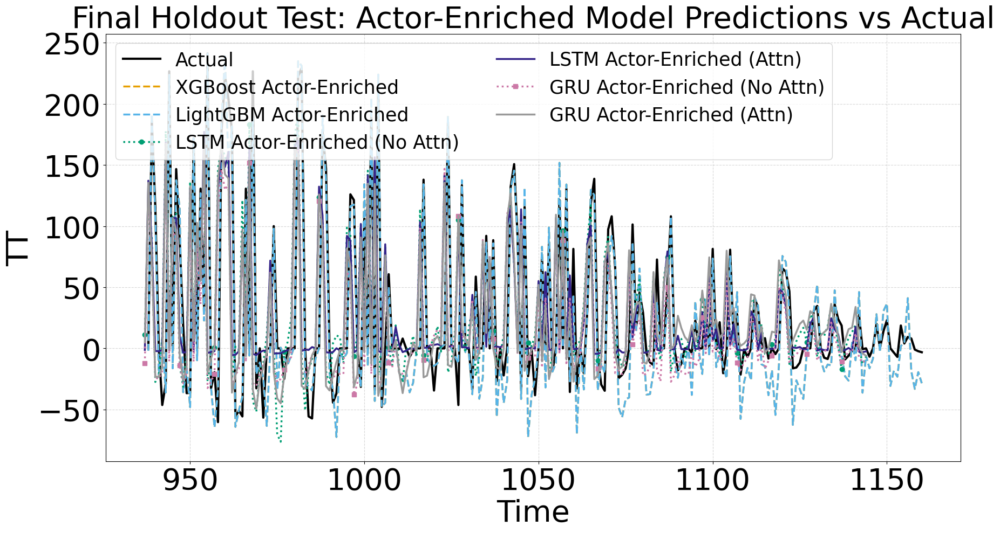

In [ ]:
import matplotlib.pyplot as plt

# Colorblind-safe distinct colors
colors = {
    'XGBoost': '#E69F00',        # Mustard
    'LightGBM': '#56B4E9',       # Light Blue
    'LSTM No Attn': '#009E73',   # Green
    'LSTM Attn': '#332288',      # Dark Blue
    'GRU No Attn': '#CC79A7',    # Light Purple
    'GRU Attn': '#999999'        # Gray
}

# Setup figure
plt.figure(figsize=(18, 10))

# Plot actual values
plt.plot(df_test_fe.index[1:], y_true, label='Actual', color='black', linewidth=3)

# Actor-enriched predictions
plt.plot(df_test_fe.index[1:][:len(pred_a)], pred_a, '--', label='XGBoost Actor-Enriched', color=colors['XGBoost'], linewidth=2.5)
plt.plot(df_test_fe.index[1:][:len(pred_a_lgbm)], pred_a_lgbm, '--', label='LightGBM Actor-Enriched', color=colors['LightGBM'], linewidth=2.5)

plt.plot(preds_final_lstm_a_noatt['index'], preds_final_lstm_a_noatt['y_pred'], ':', label='LSTM Actor-Enriched (No Attn)', color=colors['LSTM No Attn'], linewidth=2.5, marker='o', markevery=10)
plt.plot(preds_final_lstm_a['index'], preds_final_lstm_a['y_pred'], '-', label='LSTM Actor-Enriched (Attn)', color=colors['LSTM Attn'], linewidth=2.5)

plt.plot(preds_final_gru_a_noatt['index'], preds_final_gru_a_noatt['y_pred'], ':', label='GRU Actor-Enriched (No Attn)', color=colors['GRU No Attn'], linewidth=2.5, marker='s', markevery=10)
plt.plot(preds_final_gru_a['index'], preds_final_gru_a['y_pred'], '-', label='GRU Actor-Enriched (Attn)', color=colors['GRU Attn'], linewidth=2.5)

# Final styling with increased font sizes
plt.title("Final Holdout Test: Actor-Enriched Model Predictions vs Actual", fontsize=40)
plt.xlabel("Time", fontsize=40)
plt.ylabel("TT", fontsize=40)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(loc='upper left', ncol=2, fontsize=25, frameon=True)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# ARIMA

In [ ]:
# --- Step 1: Feature Engineering (residual target)
df_train_fe, _, _ = feature_engineering(df_train_full, residual_target=True)

df_context = pd.concat([df_train_full.tail(40), df_test_final])
df_test_fe, _, _ = feature_engineering(df_context, residual_target=True)
df_test_fe = df_test_fe.loc[df_test_final.index.intersection(df_test_fe.index)]

df_train_fe.dropna(inplace=True)
df_test_fe.dropna(inplace=True)

# --- Step 2: Extract aligned residual target + base
base_values = df_test_fe['TT'].shift(1)
y_test_arima = df_test_fe['target']

df_eval = pd.DataFrame({
    'base': base_values,
    'target': y_test_arima
}).dropna().reset_index()

# Final aligned series
base_values = df_eval['base'].reset_index(drop=True)
y_test_arima = df_eval['target'].reset_index(drop=True)

# --- Step 3: Fit ARIMA on residuals
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

print("📦 Training ARIMA(1,0,0) on residuals...")
y_train_arima = df_train_fe['target']
model_arima = ARIMA(y_train_arima, order=(0, 1, 0))
model_arima_fit = model_arima.fit()

# Forecast
resid_forecast = model_arima_fit.forecast(steps=len(y_test_arima))

# --- Step 4: Safe Alignment — enforce equal lengths
min_len = min(len(resid_forecast), len(base_values), len(y_test_arima))

y_pred = resid_forecast[:min_len].reset_index(drop=True) + base_values[:min_len]
y_true = base_values[:min_len] + y_test_arima[:min_len]

# --- Step 5: Evaluation
rmse_arima = np.sqrt(mean_squared_error(y_true, y_pred))
mae_arima = mean_absolute_error(y_true, y_pred)

print(f"\n📊 ARIMA Benchmark on Residuals → RMSE: {rmse_arima:.4f}, MAE: {mae_arima:.4f}")



/tmp/ipython-input-7-3627655955.py:44: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_mean{window}'] = df_model[var].rolling(window).mean().shift(1)
/tmp/ipython-input-7-3627655955.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_model[f'{var}_rolling_std{window}'] = df_model[var].rolling(window).std().shift(1)
/tmp/ipython-input-7-3627655955.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

📦 Training ARIMA(1,0,0) on residuals...

📊 ARIMA Benchmark on Residuals → RMSE: 48.3250, MAE: 43.4461


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


/tmp/ipython-input-23-1306894375.py:9: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


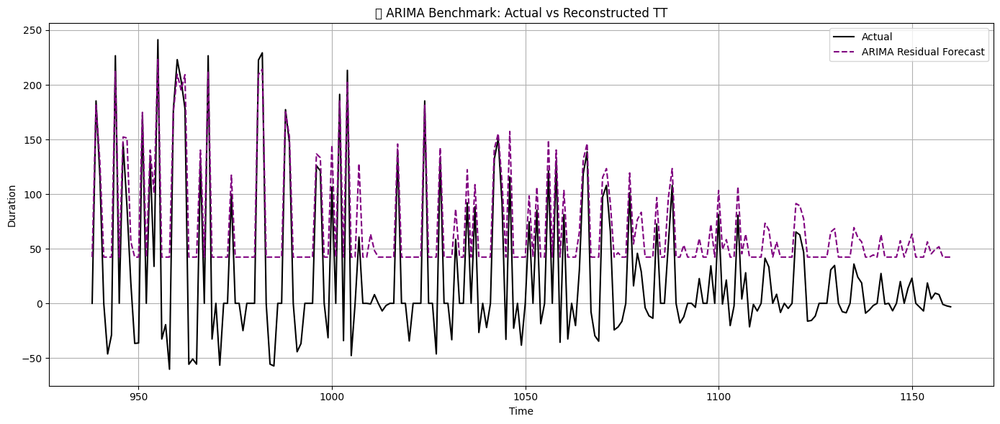

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(df_eval['index'][:min_len], y_true, label='Actual', color='black')
plt.plot(df_eval['index'][:min_len], y_pred, '--', label='ARIMA Residual Forecast', color='purple')
plt.title("🔍 ARIMA Benchmark: Actual vs Reconstructed TT")
plt.xlabel("Time")
plt.ylabel("Duration")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
